In [1]:
import numpy as np, pandas as pd
from plotnine import *
from pcaVersion import pcaVersion
from tripletsVersion import tripletsVersion
from plots import *
from processing_helpers import *
from analysis_helpers import *
%load_ext rpy2.ipython
%load_ext autoreload
%autoreload 2

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-n02k01ds because the default path (/home/jovyan/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
/opt/conda/lib/python3.8/site-packages/nilearn/datasets/__init__.py:87: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.


---

In [62]:
scores_dk = (pd.concat({
    'Published data\n(Arnatkevic̆iūtė et al.)': dk_aurina.score_from(dk_aurina),
#     'After fixes, all regions & genes': hcp_base.score_from(hcp_base, invert=[0,1,2]),
    'New processing\n(bug fixes, region & gene filters)': dk_base.score_from(dk_3donors_ds5),
})
    .groupby(level=0)
    .apply(lambda x: x/np.std(x))
    .reset_index(level=0).rename(columns={'level_0':'version'})
    .join(get_labels_dk())
)

scores_hcp = (pd.concat({
    'Published data\n(Arnatkevic̆iūtė et al.)': hcp_aurina.score_from(hcp_aurina, invert=[0,1,2]),
#     'After fixes\n(all regions & genes)': hcp_base.score_from(hcp_base, invert=[0,1,2]),
    'New processing\n(bug fixes, region & gene filters)': hcp_base.score_from(hcp_3donors_ds5),
})
    .groupby(level=0)
    .apply(lambda x: x/np.std(x))
    .reset_index(level=0).rename(columns={'level_0':'version'})
    .join(get_labels_hcp())
)

In [63]:
var_dk = (pd.concat({
    'Published data': pd.Series(dk_aurina.var),
    'New processing': pd.Series(dk_3donors_ds5.var)
}, axis=1)
          .set_index([[f'PC{i+1}' for i in range(5)]])
          .melt(ignore_index=False)
          .reset_index()
          .set_axis(['PC', 'which', 'var'],axis=1)
         )

var_hcp = (pd.concat({
    'Published data': pd.Series(hcp_aurina.var),
    'After fixes': pd.Series(hcp_base.var),
    'New processing': pd.Series(hcp_3donors_ds5.var)
}, axis=1)
          .set_index([[f'PC{i+1}' for i in range(5)]])
          .melt(ignore_index=False)
          .reset_index()
          .set_axis(['PC', 'which', 'var'],axis=1)
         )

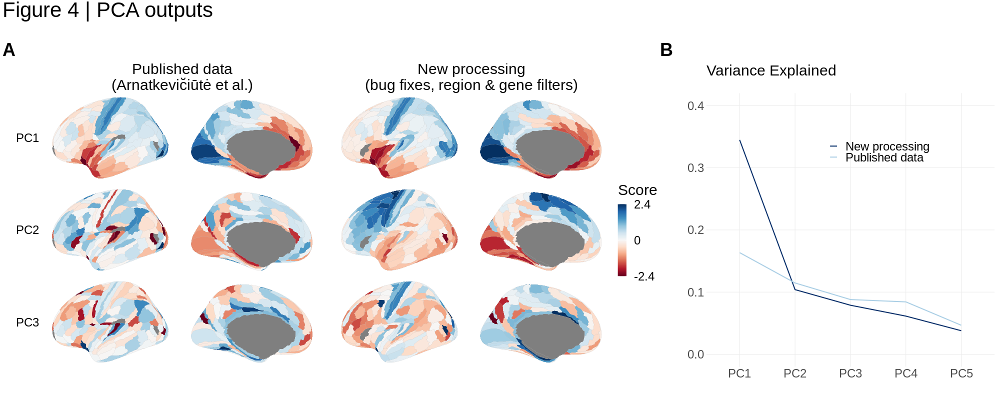

In [1829]:
%%R -w 2000 -h 800 -i scores_dk -i scores_hcp -i var_dk -i var_hcp
source("Rplots.R")
source("brainPlots.R")

# A <- plot_var_exp(var_dk)
# B <- plot_dk(scores_dk, three=T, switch='y') + theme(legend.position='right', strip.text.y.left=element_text(angle=0)) + guides(fill=guide_colorbar(title='Score', barheight=10))

A <- plot_hcp(scores_hcp, three=T, switch='y') + guides(fill=guide_colorbar(title='Score', barheight=10)) +
    theme(legend.position='right', strip.text.y.left=element_text(angle=0), strip.text.x=element_text(size=30))

B <- plot_var_exp(var_hcp) + ylab('') + ggtitle('Variance Explained') + theme(plot.title=element_text(size=30, vjust=-5.5))

(
#     ((A | B) + plot_layout(widths=c(1,2))) /
    ((A | B) + plot_layout(widths=c(2,1))) & theme(text=element_text(size=30))
) + plot_annotation(title='Figure 4 | PCA outputs', 
                    theme=theme(plot.title=element_text(size=42, hjust=0)), tag_levels='A') & theme(plot.tag=element_text(size=36, face='bold', vjust=-3))

In [76]:
scores_hcp = (pd.concat({
    'Published data\n(Arnatkevic̆iūtė et al.)': hcp_aurina.score_from(hcp_aurina, invert=[0,1,2]),
    'After bug fixes\n(all regions & genes)': hcp_base.score_from(hcp_base, invert=[0,1,2]),
    'Bug fixes and filters\n(3+ donors regions, top 50% genes)': hcp_base.score_from(hcp_3donors_ds5),
})
    .groupby(level=0)
    .apply(lambda x: x/np.std(x))
    .reset_index(level=0).rename(columns={'level_0':'version'})
    .join(get_labels_hcp())
)

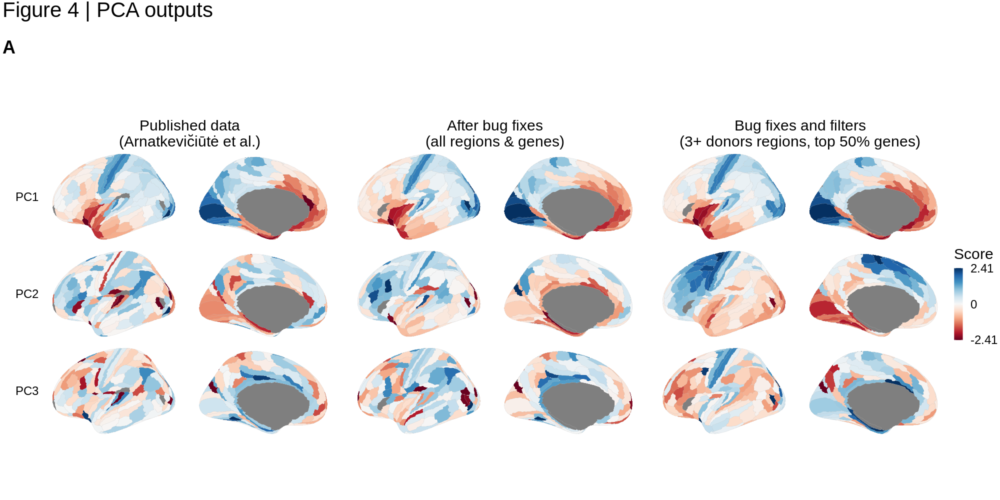

In [77]:
%%R -w 2000 -h 1000 -i scores_dk -i scores_hcp -i var_dk -i var_hcp
source("Rplots.R")
source("brainPlots.R")

# A <- plot_var_exp(var_dk)
# B <- plot_dk(scores_dk, three=T, switch='y') + theme(legend.position='right', strip.text.y.left=element_text(angle=0)) + guides(fill=guide_colorbar(title='Score', barheight=10))

A <- plot_hcp(scores_hcp, three=T, switch='y') + guides(fill=guide_colorbar(title='Score', barheight=10)) +
    theme(legend.position='right', strip.text.y.left=element_text(angle=0), strip.text.x=element_text(size=30))

B <- plot_var_exp(var_hcp) + ylab('') + ggtitle('Variance Explained') + theme(plot.title=element_text(size=30, vjust=-5.5))

(
#     ((A | B) + plot_layout(widths=c(1,2))) /
#     ((A | B) + plot_layout(widths=c(2,1))) 
    A
    & theme(text=element_text(size=30))
) + plot_annotation(title='Figure 4 | PCA outputs', 
                    theme=theme(plot.title=element_text(size=42, hjust=0)), tag_levels='A') & theme(plot.tag=element_text(size=36, face='bold', vjust=-3))

---

# Figure: Processing pipeline alignment

In [2]:
files = abagen.fetch_microarray(donors='all', data_dir='../abagen-data/microarray')
annotation = pd.concat({donor:pd.read_csv(f['annotation']) for donor, f in files.items()})

Original versions

In [3]:
path = '../AHBAprocessing-data/processedData/DK_DS_meanSubj/'
expression = read_expression_aurina(path)
labels = read_labels_aurina(path, annotation)
dk_aurina = pcaVersion(expression, labels)

New PCA version


In [4]:
path = '../AHBAprocessing-data/processedData/HCP_DS_meanSubj/'
expression = read_expression_aurina(path)
labels = read_labels_aurina(path, annotation)
hcp_aurina = pcaVersion(expression, labels)

New PCA version


In [5]:
# expression_dk_orig, labels_dk_orig = get_expression_abagen(
#     atlas=fetch_dk(only_cortex=True, only_left=True), only_cortex=False, only_left=False,
# #     probe_selection='max_intensity', region_agg='samples', lr_mirror=None,
#     probe_selection='diff_stability', region_agg='donors', lr_mirror=None,
#     save_name='DK_orig.csv', return_labels=True)
expression_dk_orig = pd.read_csv("../abagen-data/expression/DK_orig.csv", index_col='label')
labels_dk_orig = pd.read_csv("../abagen-data/labels/DK_orig.csv", index_col='well_id')
dk_abagen_orig = pcaVersion(expression_dk_orig, labels_dk_orig)

New PCA version


In [6]:
# expression_hcp_orig, labels_hcp_orig = get_expression_abagen(
#     atlas=fetch_hcp(only_left=True), only_cortex=False, only_left=False,
# #     probe_selection='max_intensity', region_agg='samples', lr_mirror=None,
#     probe_selection='diff_stability', region_agg='donors', lr_mirror=None,
#     save_name='HCP_orig.csv', return_labels=True)
expression_hcp_orig = pd.read_csv("../abagen-data/expression/HCP_orig.csv", index_col='label')
labels_hcp_orig = pd.read_csv("../abagen-data/labels/HCP_orig.csv", index_col='well_id')
hcp_abagen_orig = pcaVersion(expression_hcp_orig, labels_hcp_orig)

New PCA version


Fixed versions

In [7]:
path = '../AHBAprocessing-data/processedData/DK_DS_meanSubj_ZeroIndex/'
expression = read_expression_aurina(path)
labels = read_labels_aurina(path, annotation)
dk_aurina_zero = pcaVersion(expression, labels)

New PCA version


In [8]:
path = '../AHBAprocessing-data/processedData/HCP_DS_meanSubj_ZeroIndex/'
expression = read_expression_aurina(path)
labels = read_labels_aurina(path, annotation)
hcp_aurina_zero = pcaVersion(expression, labels)

New PCA version


In [9]:
# expression_dk, labels_dk = get_expression_abagen(
#     atlas=fetch_dk(), only_cortex=True, only_left=True,
# #     probe_selection='max_intensity', region_agg='samples', lr_mirror=None,
#     probe_selection='diff_stability', region_agg='donors', lr_mirror=None,
#     save_name='DK.csv', return_labels=True)
expression_dk = pd.read_csv("../abagen-data/expression/DK.csv", index_col='label')
labels_dk = pd.read_csv("../abagen-data/labels/DK.csv", index_col='well_id')
dk_abagen = pcaVersion(expression_dk, labels_dk)

New PCA version


In [10]:
# expression_hcp, labels_hcp = get_expression_abagen(
#     atlas=fetch_hcp(), only_cortex=True, only_left=True,
# #     probe_selection='max_intensity', region_agg='samples', lr_mirror=None,
#     probe_selection='diff_stability', region_agg='donors', lr_mirror=None,
#     save_name='HCP.csv', return_labels=True)
expression_hcp = pd.read_csv("../abagen-data/expression/HCP.csv", index_col='label')
labels_hcp = pd.read_csv("../abagen-data/labels/HCP.csv", index_col='well_id')
hcp_abagen = pcaVersion(expression_hcp, labels_hcp)

New PCA version


Compare expression matrices

In [337]:
corrs_before = pd.concat({
    'DK': dk_aurina.expression.corrwith(dk_abagen_orig.expression),
    'HCP': hcp_aurina.expression.corrwith(hcp_abagen_orig.expression)
}).dropna().reset_index().set_axis(['atlas', 'gene', 'corr'],axis=1)

corrs_after = pd.concat({
    'DK': dk_aurina_zero.expression.corrwith(dk_abagen.expression),
    'HCP': hcp_aurina_zero.expression.corrwith(hcp_abagen.expression)
}).dropna().reset_index().set_axis(['atlas', 'gene', 'corr'],axis=1)

Compare sample matching

In [1401]:
matching_before = pd.concat({
    'DK': compare_matching(dk_aurina, dk_abagen_orig, annotation),
    'HCP':compare_matching(hcp_aurina, hcp_abagen_orig, annotation),
}).reset_index(level=0).rename(columns={'level_0':'version'})

matching_after = pd.concat({
    'DK':compare_matching(dk_aurina_zero, dk_abagen, annotation),
    'HCP':compare_matching(hcp_aurina_zero, hcp_abagen, annotation)
}).reset_index(level=0).rename(columns={'level_0':'version'})

Compare PCA scores

In [12]:
corrs_dict_before = {
    'DK': dk_abagen_orig.corr_scores(dk_aurina),
    'HCP': hcp_abagen_orig.corr_scores(hcp_aurina),
}
df_corrs_before = pd.concat(corrs_dict_before,axis=0).stack().reset_index().set_axis(['version','x','y','corr'],axis=1)

corrs_dict_after = {
    'DK': dk_abagen.corr_scores(dk_aurina_zero),
    'HCP': hcp_abagen.corr_scores(hcp_aurina_zero)
}
df_corrs_after = pd.concat(corrs_dict_after,axis=0).stack().reset_index().set_axis(['version','x','y','corr'],axis=1)

Compare clusters

In [356]:
expression_samples, coords_samples = abagen.get_samples_in_mask(
    mask=fetch_dk(only_cortex=True, only_left=True)['image'],
    n_proc=16, data_dir='../abagen-data/microarray', verbose=1
)

INFO: Donor-specific atlases provided; using native coords for tissue samples
INFO: Reannotating probes with information from Arnatkevic̆iūtė et al., 2019, NeuroImage
INFO: Filtering probes with intensity-based threshold of 0.5
INFO: 31577 probes survive intensity-based filtering
INFO: Reducing probes indexing same gene with method: diff_stability
INFO: 15635 genes remain after probe filtering + selection
INFO: 231 / 904 samples matched to regions for donor #9861
INFO: 189 / 826 samples matched to regions for donor #10021
INFO: 197 / 353 samples matched to regions for donor #12876
INFO: 268 / 518 samples matched to regions for donor #14380
INFO: 233 / 439 samples matched to regions for donor #15496
INFO: 249 / 421 samples matched to regions for donor #15697


In [357]:
df_cluster_coords = get_clusters(expression_samples, coords_samples)

0    1314
1      53
Name: samples, dtype: int64


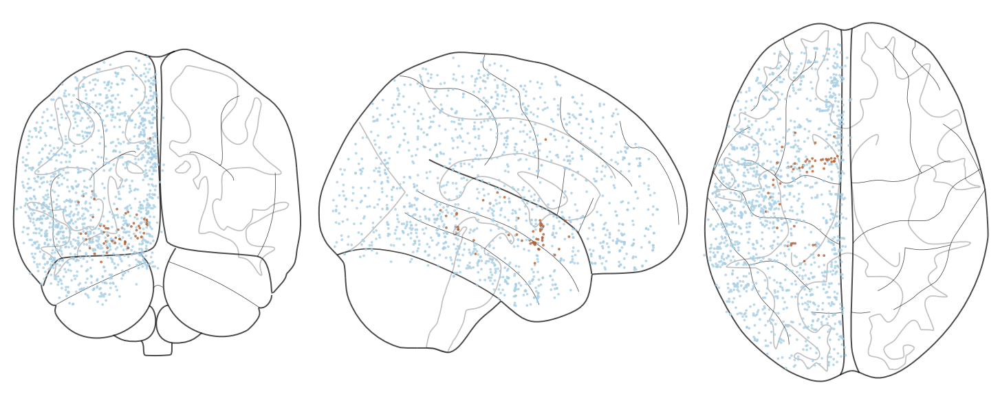

In [606]:
plot_clusters(df_cluster_coords)

In [361]:
expression_samples_filter, coords_samples_filter = abagen_allen_tweaked.get_samples_in_mask(
    mask=fetch_dk()['image'],
    n_proc=16, data_dir='../abagen-data/microarray', verbose=1,
    only_cortex=True, only_left=True
)

INFO: Donor-specific atlases provided; using native coords for tissue samples
INFO: Reannotating probes with information from Arnatkevic̆iūtė et al., 2019, NeuroImage
INFO: Filtering probes with intensity-based threshold of 0.5
INFO: 32914 probes survive intensity-based filtering
INFO: Reducing probes indexing same gene with method: diff_stability
INFO: 16009 genes remain after probe filtering + selection
INFO: 224 / 228 samples matched to regions for donor #9861
INFO: 178 / 180 samples matched to regions for donor #10021
INFO: 179 / 181 samples matched to regions for donor #12876
INFO: 261 / 263 samples matched to regions for donor #14380
INFO: 224 / 224 samples matched to regions for donor #15496
INFO: 235 / 240 samples matched to regions for donor #15697
INFO: 83 / 82 regions have >=0 total samples
INFO: 83 / 82 regions have samples from >=0 donors


In [373]:
df_cluster_coords_filter = get_clusters(expression_samples_filter.dropna(axis=1), coords_samples_filter)

0    796
1    505
Name: samples, dtype: int64


In [600]:
import matplotlib.pyplot as plt
plt.get_cmap('Blues',1)

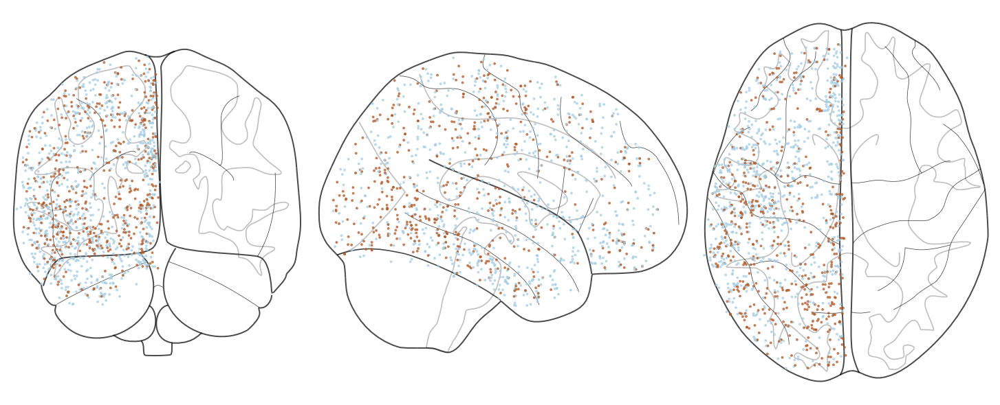

In [607]:
plot_clusters(df_cluster_coords_filter, save_name='clusters_filter')

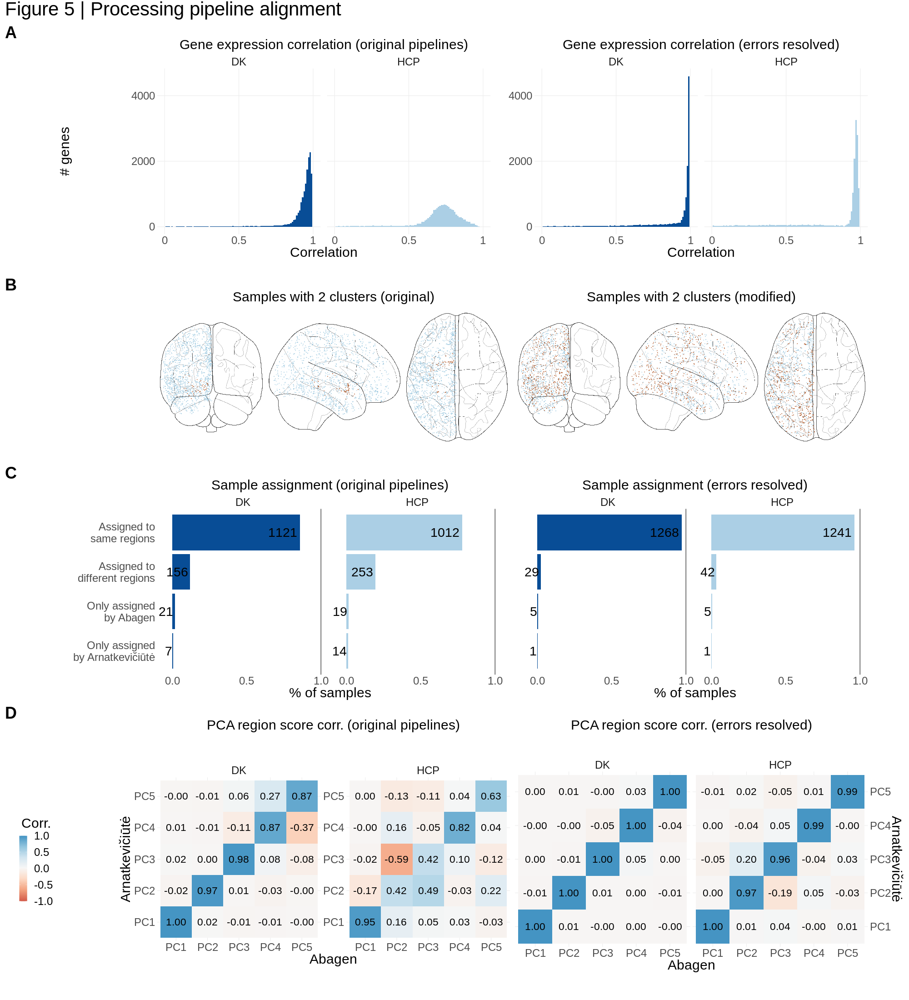

In [1836]:
%%R -w 2000 -h 2200 -i corrs_before -i corrs_after -i matching_before -i matching_after -i df_corrs_before -i df_corrs_after
library(png)
library(ggpubr)
clusters <- readPNG("clusters.png", native=T)
clusters_filter <- readPNG("clusters_filter.png", native=T)
g0 <- ggplot() + background_image(clusters) + coord_fixed(ratio=8/20) + ggtitle('Samples with 2 clusters (original)')
g0x <- ggplot() + background_image(clusters_filter) + coord_fixed(ratio=8/20) + ggtitle('Samples with 2 clusters (modified)') + plot_layout(tag_level='new')

source("Rplots.R")
g1 <- plot_exp_corr(corrs_before) + ggtitle('Gene expression correlation (original pipelines)')
g1x <- plot_exp_corr(corrs_after) + ylab('') + ggtitle('Gene expression correlation (errors resolved)') + plot_layout(tag_level='new')
g2 <- plot_matching(matching_before) + ggtitle('Sample assignment (original pipelines)')
g2x <- plot_matching(matching_after) + ggtitle('Sample assignment (errors resolved)') + theme(axis.text.y=element_blank()) + plot_layout(tag_level='new')
g3 <- plot_corrs(df_corrs_before, xlab='Abagen', ylab='Arnatkevic̆iūtė') + ggtitle('PCA region score corr. (original pipelines)')
g3x <- plot_corrs(df_corrs_after, xlab='Abagen', ylab='Arnatkevic̆iūtė') + ggtitle('PCA region score corr. (errors resolved)') + scale_y_discrete(position='right') + plot_layout(tag_level='new')

(
 (g1 | g1x) / 
 (g0 | g0x) / 
 (g2 | g2x) / 
 ((g3 | g3x) + plot_layout(guides='collect')) + 
 plot_layout(heights=c(3,3,3,4)) & 
 theme(text=element_text(size=30), plot.title=element_text(size=30, hjust=0.5), 
       legend.position='left', legend.title.align=0.5) 
) +
plot_annotation(tag_levels='A',title='Figure 5 | Processing pipeline alignment', 
                theme=theme(plot.title=element_text(size=42, hjust=0))) & theme(plot.tag=element_text(size=36, face='bold'))

In [510]:
(hcp_abagen.expression.join(get_labels_hcp()).set_index('label')
 .rename_axis('region',axis=0).apply(lambda x: np.round(x,3))).iloc[:,:8]

,A1BG,A1BG-AS1,A2M,A2ML1,A3GALT2,A4GALT,AAAS,AACS
region,,,,,,,,
V1,-1.819,-1.990,0.774,0.722,0.437,-0.083,1.141,-1.046
MST,0.194,-0.513,-0.825,-2.358,1.752,2.978,1.515,-0.697
V6,-0.182,-0.426,-0.364,0.389,1.454,3.599,1.718,2.289
V2,-1.191,-1.934,0.645,-0.730,-0.255,-0.662,0.932,-1.161
V3,-1.764,-2.356,-0.394,0.913,0.414,1.237,0.918,-1.421
...,...,...,...,...,...,...,...,...
STSva,1.008,0.718,0.149,0.118,0.196,-0.460,-0.431,-0.253
TE1m,0.946,1.524,-0.595,0.406,0.258,0.160,-0.155,0.861
PI,2.166,1.616,-2.118,-1.602,-0.845,-0.598,-0.428,0.344


---

# Figure: Parcellations

In [12]:
expression_dk,  _, counts_dk  = get_expression_abagen(atlas=fetch_dk(), return_labels=True, return_counts=True)
expression_hcp, _, counts_hcp = get_expression_abagen(atlas=fetch_hcp(), return_labels=True, return_counts=True)

dk_base = pcaVersion(expression_dk)
hcp_base = pcaVersion(expression_hcp)

15946 genes remain after filtering for top 1 differential stability
15946 genes remain after filtering for top 1 differential stability
New PCA version
New PCA version


In [11]:
dk_3donors_ds5 = pcaVersion(get_expression_abagen(atlas=fetch_dk(), donors_threshold=3, DS_threshold=0.5))
hcp_3donors_ds5 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.5))

7973 genes remain after filtering for top 0.5 differential stability
New PCA version
7973 genes remain after filtering for top 0.5 differential stability
New PCA version


In [16]:
dist_samp_dk = counts_dk.sum(axis=1).rename('count').to_frame().join(get_labels_dk()).loc[:34]
dist_samp_hcp = counts_hcp.sum(axis=1).rename('count').to_frame().join(get_labels_hcp()).loc[:180]
df_dist_samp = pd.concat({'DK':dist_samp_dk, 'HCP':dist_samp_hcp}).reset_index(level=0).rename(columns={'level_0':'atlas'})

In [17]:
dist_donors_dk = (counts_dk!=0).sum(axis=1).rename('count').to_frame().join(get_labels_dk()).loc[:34]
dist_donors_hcp = (counts_hcp!=0).sum(axis=1).rename('count').to_frame().join(get_labels_hcp()).loc[:180]
df_dist_donors = pd.concat({'DK':dist_donors_dk, 'HCP':dist_donors_hcp}).reset_index(level=0).rename(columns={'level_0':'atlas'})

In [1679]:
corrs_dict = {
#     'Original':dk_abagen_orig.corr_coefs(hcp_abagen_orig),
#     'Fixed':dk_abagen.corr_coefs(hcp_abagen),
    'DK vs HCP gene weights corr.\n(original outputs)': dk_aurina.corr_coefs(hcp_aurina),
#     'DK-to-HCP scores': correlate(hcp_abagen_orig.score_from(dk_abagen_orig), hcp_abagen_orig.score_from(hcp_abagen_orig)),
    'DK vs HCP gene weights corr.\n(new processing)':dk_base.corr_coefs(hcp_3donors_ds5),
#     'Region scores (before fixes)': correlate(hcp_aurina.score_from(dk_aurina), hcp_aurina.scores),
    'DK vs HCP region scores corr.\n(DK projected to HCP)': correlate(hcp_base.score_from(dk_base), hcp_base.score_from(hcp_3donors_ds5)),
#     'HCP-to-DK scores': correlate(dk_base.score_from(dk_3donors_ds5), dk_base.score_from(hcp_3donors_ds5))
#     'DK base vs 3donors ds5':dk_abagen.corr_coefs(dk_3donors_ds5),
#     'HCP base vs 3donors ds5':dk_abagen.corr_coefs(hcp_3donors_ds5)
}

df_corrs = (pd.concat(corrs_dict,axis=0)
          .stack().reset_index().set_axis(['version','x','y','corr'],axis=1)
          .assign(version = lambda x: pd.Categorical(x['version'], categories=x['version'].unique(), ordered=True))
           )

In [1680]:
scores_dk = (pd.concat({
    'DK region scores': dk_base.score_from(dk_base, invert=[]),
#     'HCP-3donors-ds5-projected-DK': dk_base.score_from(hcp_3donors_ds5),
})
    .groupby(level=0)
    .apply(lambda x: x/np.std(x))
    .reset_index(level=0).rename(columns={'level_0':'version'})
    .join(get_labels_dk())
)

scores_hcp = (pd.concat({
#     'HCP-all': hcp_base.score_from(hcp_base, invert=[0]),
#     'HCP-3donor-ds5': hcp_3donors_ds5.score_from(hcp_3donors_ds5),
    'HCP region scores': hcp_base.score_from(hcp_3donors_ds5),
    'DK weights in HCP regions': hcp_base.score_from(dk_base),
#     'DK-projected-HCP': hcp_base.score_from(dk_base),
})
    .groupby(level=0)
    .apply(lambda x: x/np.std(x))
    .reset_index(level=0).rename(columns={'level_0':'version'})
    .join(get_labels_hcp())
)

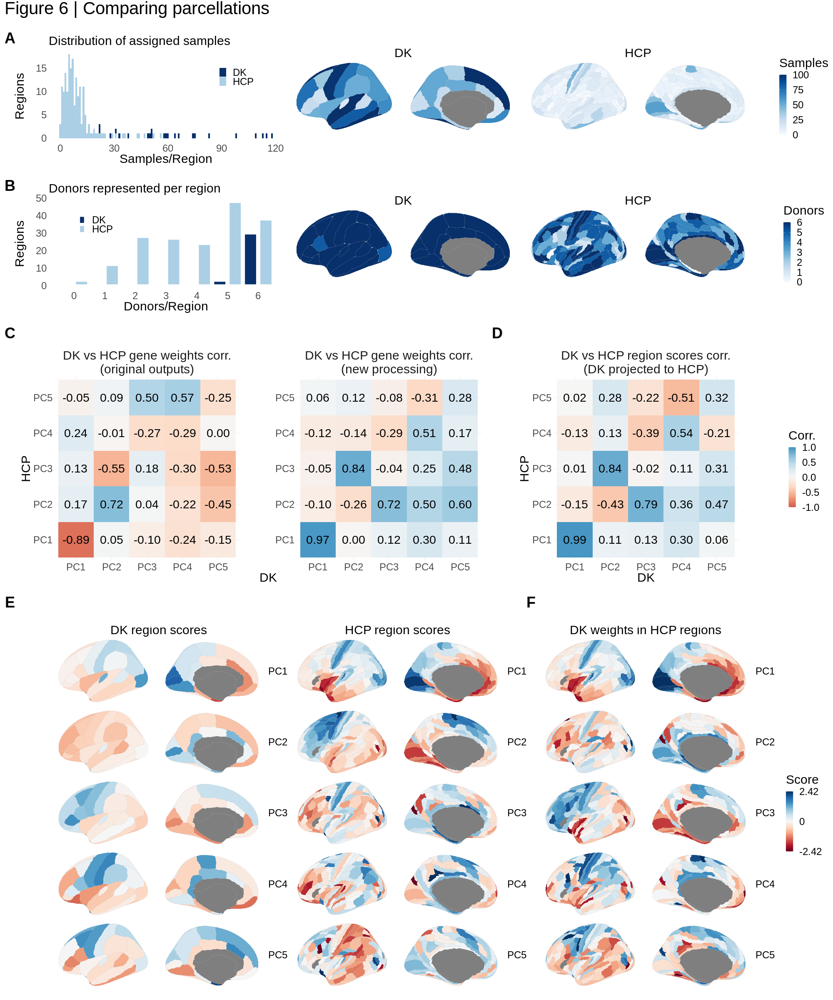

In [1690]:
%%R -w 2000 -h 2400 -i scores_hcp -i scores_dk -i df_corrs -i df_dist_samp -i dist_samp_dk -i dist_samp_hcp -i df_dist_donors -i dist_donors_dk -i dist_donors_hcp
source("brainPlots.R")
source("Rplots.R")

A1 <- plot_dist(df_dist_samp) + ggtitle('Distribution of assigned samples') + theme(plot.title=element_text(size=30, hjust=0))
A2 <- plot_dk_dist(dist_samp_dk) + ggtitle('DK') + theme(plot.title=element_text(size=30))
A3 <- plot_hcp_dist(dist_samp_hcp) + plot_layout(tag_level='new') + ggtitle('HCP') + theme(plot.title=element_text(size=30))

B1 <- plot_dist_donors(df_dist_donors) + ggtitle('Donors represented per region') + theme(plot.title=element_text(size=30, hjust=0))
B2 <- plot_dk_dist(dist_donors_dk, lim=c(0,6), name='Donors') + ggtitle('DK') + theme(plot.title=element_text(size=30))
B3 <- plot_hcp_dist(dist_donors_hcp, lim=c(0,6), name='Donors') + plot_layout(tag_level='new') + 
ggtitle('HCP') + theme(plot.title=element_text(size=30))

C1 <- plot_corrs(df_corrs %>% filter(!grepl("region", version)), size=10) + guides(fill=guide_colorbar(title='Corr.',barheight=10))
C2 <- plot_corrs(df_corrs %>% filter(grepl("region", version)), size=10) + guides(fill=guide_colorbar(title='Corr.',barheight=10))

D1 <- plot_dk(scores_dk) + guides(fill='none')
D2 <- plot_hcp(scores_hcp %>% filter(version=='HCP region scores')) + guides(fill='none') + plot_layout(tag_level='new')
D3 <- plot_hcp(scores_hcp %>% filter(version!='HCP region scores')) + guides(fill=guide_colorbar(direction='vertical', title='Score',barheight=10))

(                                                                
(
    ((A1 | (A2 | A3) + plot_layout(guides='collect', tag_level='new')) + plot_layout(widths=c(1,2))) /
    ((B1 | (B2 | B3) + plot_layout(guides='collect', tag_level='new')) + plot_layout(widths=c(1,2))) /
    ((C1 + theme(panel.spacing=unit(6,'lines')) | C2) + plot_layout(widths=c(2,1), guides='collect')) / 
    ((D1 | D2 | D3) + plot_layout(guides='collect') )#+ theme(plot.tag=element_text(vjust=-6)))
) + plot_layout(heights=c(1,1,2,4)) & theme(text=element_text(size=30), strip.text.x=element_text(size=30))
) + plot_annotation(tag_levels='A',title='Figure 6 | Comparing parcellations',
                theme=theme(plot.title=element_text(size=42, hjust=0))) & theme(plot.tag=element_text(size=36, face='bold', vjust=-2))

In [593]:
counts_hcp.sum(axis=1).loc[:34].describe()

count    34.000000
mean     11.264706
std      13.455446
min       1.000000
25%       3.000000
50%       6.000000
75%      12.500000
max      56.000000
dtype: float64

---

# Triplets

---

In [26]:
files = abagen.fetch_microarray(donors='all', data_dir='../abagen-data/microarray')
donors = list(files.keys())
donors

['9861', '10021', '12876', '14380', '15496', '15697']

In [27]:
from itertools import combinations
triplets_list = [list(x) for x in list(combinations(range(6), 3))]
triplets_names = [''.join(map(str,x)) for x in triplets_list]
triplets_dict = dict(zip(triplets_names, triplets_list))
triplets_dict_donors = {k:[donors[i] for i in v] for k,v in triplets_dict.items()}
disjoint_triplets = [list(x) for x in combinations(triplets_names,2) if not any(set(list(x[0])).intersection(set(list(x[1]))))]

In [488]:
hcp_triplets_3donors_ds8 = {}
for name, donors in triplets_dict_donors.items():
    expression, stability = get_expression_abagen(fetch_hcp(), donors=donors,
        probe_selection='diff_stability', region_agg='donors',
        donors_threshold=3, lr_mirror='rightleft', DS_threshold=0.8,
        return_stability=True
    )
    hcp_triplets_3donors_ds8[name] = pcaVersion(expression)
    hcp_triplets_3donors_ds8[name].stability = stability

3133 genes remain after filtering for top 0.2 differential stability


ValueError: too many values to unpack (expected 2)

In [ ]:
hcp_triplets_3donors = {}
for name, donors in triplets_dict_donors.items():
    expression = get_expression_abagen(fetch_hcp(), donors=donors,
        probe_selection='diff_stability', region_agg='donors',
        donors_threshold=3, lr_mirror='rightleft'#, DS_threshold=0.8
    )
    hcp_triplets_3donors[name] = pcaVersion(expression)

New PCA version
New PCA version
New PCA version


In [ ]:
hcp_triplets_ds8 = {}
for name, donors in triplets_dict_donors.items():
    expression = get_expression_abagen(fetch_hcp(), donors=donors,
        probe_selection='diff_stability', region_agg='donors',
        lr_mirror='rightleft', DS_threshold=0.8
    )
    hcp_triplets_ds8[name] = pcaVersion(expression)

In [ ]:
hcp_triplets = {}
for name, donors in triplets_dict_donors.items():
    expression = get_expression_abagen(fetch_hcp(), donors=donors,
        probe_selection='diff_stability', region_agg='donors',
        lr_mirror='rightleft'
    )
    hcp_triplets[name] = pcaVersion(expression)

In [533]:
dk_triplets_3donors_ds8 = {}
for name, donors in triplets_dict_donors.items():
    expression = get_expression_abagen(fetch_dk(), donors=donors,
        probe_selection='diff_stability', region_agg='donors',
        donors_threshold=3, lr_mirror='rightleft', DS_threshold=0.8
    )
    dk_triplets_3donors_ds8[name] = pcaVersion(expression)

3133 genes remain after filtering for top 0.2 differential stability
New PCA version
3141 genes remain after filtering for top 0.2 differential stability
New PCA version
3174 genes remain after filtering for top 0.2 differential stability
New PCA version
3186 genes remain after filtering for top 0.2 differential stability
New PCA version
3114 genes remain after filtering for top 0.2 differential stability
New PCA version
3146 genes remain after filtering for top 0.2 differential stability
New PCA version
3161 genes remain after filtering for top 0.2 differential stability
New PCA version
3153 genes remain after filtering for top 0.2 differential stability
New PCA version
3169 genes remain after filtering for top 0.2 differential stability
New PCA version
3209 genes remain after filtering for top 0.2 differential stability
New PCA version
3159 genes remain after filtering for top 0.2 differential stability
New PCA version
3206 genes remain after filtering for top 0.2 differential stabil

In [534]:
dk_triplets_3donors = {}
for name, donors in triplets_dict_donors.items():
    expression = get_expression_abagen(fetch_dk(), donors=donors,
        probe_selection='diff_stability', region_agg='donors',
        donors_threshold=3, lr_mirror='rightleft'#, DS_threshold=0.8
    )
    dk_triplets_3donors[name] = pcaVersion(expression)

New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version


In [535]:
dk_triplets_ds8 = {}
for name, donors in triplets_dict_donors.items():
    expression = get_expression_abagen(fetch_dk(), donors=donors,
        probe_selection='diff_stability', region_agg='donors',
        lr_mirror='rightleft', DS_threshold=0.8
    )
    dk_triplets_ds8[name] = pcaVersion(expression)

3133 genes remain after filtering for top 0.2 differential stability
New PCA version
3141 genes remain after filtering for top 0.2 differential stability
New PCA version
3173 genes remain after filtering for top 0.2 differential stability
New PCA version
3186 genes remain after filtering for top 0.2 differential stability
New PCA version
3113 genes remain after filtering for top 0.2 differential stability
New PCA version
3146 genes remain after filtering for top 0.2 differential stability
New PCA version
3161 genes remain after filtering for top 0.2 differential stability
New PCA version
3151 genes remain after filtering for top 0.2 differential stability
New PCA version
3169 genes remain after filtering for top 0.2 differential stability
New PCA version
3208 genes remain after filtering for top 0.2 differential stability
New PCA version
3158 genes remain after filtering for top 0.2 differential stability
New PCA version
3206 genes remain after filtering for top 0.2 differential stabil

In [599]:
dk_triplets = {}
for name, donors in triplets_dict_donors.items():
    expression = get_expression_abagen(fetch_dk(), donors=donors,
        probe_selection='diff_stability', region_agg='donors',
        lr_mirror='rightleft'
    )
    dk_triplets[name] = pcaVersion(expression)

New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version


In [1831]:
coefs_dict = {
    'All regions, all genes': disjoint_corrs(hcp_triplets),
    'All regions, \ntop 20% DS genes': disjoint_corrs(hcp_triplets_ds8),
    '3-donor regions, \nall genes': disjoint_corrs(hcp_triplets_3donors),
    '3-donor regions, \ntop 20% DS genes': disjoint_corrs(hcp_triplets_3donors_ds8),
}

scores_dict = {
    'All regions, all genes': disjoint_corrs(hcp_triplets, how='scores'),
    'All regions, \ntop 20% DS genes': disjoint_corrs(hcp_triplets_ds8, how='scores'),
    '3-donor regions, \nall genes': disjoint_corrs(hcp_triplets_3donors, how='scores'),
    '3-donor regions, \ntop 20% DS genes': disjoint_corrs(hcp_triplets_3donors_ds8, how='scores'),
}

triplet_versions_hcp = (
    pd.concat({'Gene weights':pd.concat(coefs_dict), 'Region scores':pd.concat(scores_dict)})
    .reset_index()
    .rename(columns={'level_0':'how', 'level_1':'version', 'level_2':'component'})
    .assign(component=lambda x: x['component'].replace({i:f'{i+1}' for i in range(5)}))
    .melt(id_vars=['how', 'version', 'component'], var_name='pair', value_name='corr')
    .assign(corr_abs = lambda x: np.abs(x['corr']))
    .assign(version = lambda x: pd.Categorical(x['version'], categories=x['version'].unique(),ordered=True))
)

In [1830]:
coefs_dict = {
    'All regions, all genes': disjoint_corrs(dk_triplets),
    'All regions, top 20% DS genes': disjoint_corrs(dk_triplets_ds8),
    '3-donor regions, all genes': disjoint_corrs(dk_triplets_3donors),
    '3-donor regions, top 20% DS genes': disjoint_corrs(dk_triplets_3donors_ds8),
}

scores_dict = {
    'All regions, all genes': disjoint_corrs(dk_triplets, how='scores'),
    'All regions, top 20% DS genes': disjoint_corrs(dk_triplets_ds8, how='scores'),
    '3-donor regions, all genes': disjoint_corrs(dk_triplets_3donors, how='scores'),
    '3-donor regions, top 20% DS genes': disjoint_corrs(dk_triplets_3donors_ds8, how='scores'),
}

triplet_versions_dk = (
    pd.concat({'Gene weights':pd.concat(coefs_dict), 'Region scores':pd.concat(scores_dict)})
    .reset_index()
    .rename(columns={'level_0':'how', 'level_1':'version', 'level_2':'component'})
    .assign(component=lambda x: x['component'].replace({i:f'{i+1}' for i in range(5)}))
    .melt(id_vars=['how', 'version', 'component'], var_name='pair', value_name='corr')
    .assign(corr_abs = lambda x: np.abs(x['corr']))
    .assign(version = lambda x: pd.Categorical(x['version'], categories=x['version'].unique(),ordered=True))
)

NameError: name 'dk_triplets' is not defined

In [549]:
df_stability = (pd.concat({k:pd.Series(v.stability) for k,v in hcp_triplets_3donors_ds8.items()})
 .to_frame().reset_index(0).set_axis(['triplet','DS'],axis=1))

In [557]:
np.quantile(df_stability.DS, .8)

0.30893956166620995

In [1707]:
d1={pair[0]:'-'.join(pair) for pair in disjoint_triplets}
d2={pair[1]:'-'.join(pair) for pair in disjoint_triplets}
d={k:v for d in [d1,d2] for k,v in d.items()}
t_ordered = [j for i in disjoint_triplets for j in i]

df_exist_regions = (
    pd.concat({k:v.scores.iloc[:,:0].assign(exist=1) 
               for k,v in hcp_triplets_3donors_ds8.items()},axis=1)
    .droplevel(1,axis=1)
    .fillna(0)
    .assign(n=lambda x: x.sum(axis=1))
    .reset_index()
#     .sort_values(['n']+t_ordered,ascending=False)
    .sort_values(['n'],ascending=False)
    .melt(id_vars=['label', 'n'], var_name='triplet',value_name='exist',ignore_index=False)
#     .sort_values(['n','triplet'],ascending=False)
    .assign(pair=lambda x: x['triplet'].map(d))
    .assign(exist_pair=lambda x: np.where(x['exist']==1,x['pair'],'0'))
    .assign(exist_pair=lambda x: pd.Categorical(x['exist_pair'],ordered=True))
    .assign(triplet=lambda x: pd.Categorical(x['triplet'],categories=t_ordered,ordered=True))
    .assign(region=lambda x: pd.Categorical(x['label'].astype('str'),ordered=True))
)
df_exist_regions

,label,n,triplet,exist,pair,exist_pair,region
0,1,20.0,012,1.0,012-345,012-345,1
37,51,20.0,012,1.0,012-345,012-345,51
41,55,20.0,012,1.0,012-345,012-345,55
43,58,20.0,012,1.0,012-345,012-345,58
53,69,20.0,012,1.0,012-345,012-345,69
...,...,...,...,...,...,...,...
92,126,1.0,345,0.0,012-345,0,126
57,74,1.0,345,0.0,012-345,0,74
8,13,1.0,345,0.0,012-345,0,13
54,70,1.0,345,0.0,012-345,0,70


In [1378]:
d1={pair[0]:'-'.join(pair) for pair in disjoint_triplets}
d2={pair[1]:'-'.join(pair) for pair in disjoint_triplets}
d={k:v for d in [d1,d2] for k,v in d.items()}
t_ordered = [j for i in disjoint_triplets for j in i]

df_exist = (
    pd.concat({k:v.coefs.T.iloc[:,:0].assign(exist=1) 
               for k,v in hcp_triplets_3donors_ds8.items()},axis=1)
    .droplevel(1,axis=1)
    .fillna(0)
    .assign(n=lambda x: x.sum(axis=1))
    .reset_index()
#     .sort_values(['n']+t_ordered,ascending=False)
    .sort_values(['n'],ascending=False)
    .melt(id_vars=['gene_symbol', 'n'], var_name='triplet',value_name='exist',ignore_index=False)
#     .sort_values(['n','triplet'],ascending=False)
    .assign(pair=lambda x: x['triplet'].map(d))
    .assign(exist_pair=lambda x: np.where(x['exist']==1,x['pair'],'0'))
    .assign(exist_pair=lambda x: pd.Categorical(x['exist_pair'],ordered=True))
    .assign(triplet=lambda x: pd.Categorical(x['triplet'],categories=t_ordered,ordered=True))
    .assign(gene_symbol=lambda x: pd.Categorical(x['gene_symbol'],ordered=True))
)
df_exist

,gene_symbol,n,triplet,exist,pair,exist_pair
0,A1BG,20.0,012,1.0,012-345,012-345
1603,MAPK10,20.0,012,1.0,012-345,012-345
1554,LRRN2,20.0,012,1.0,012-345,012-345
3039,WLS,20.0,012,1.0,012-345,012-345
3040,WNT10A,20.0,012,1.0,012-345,012-345
...,...,...,...,...,...,...
5550,SALL2,1.0,345,0.0,012-345,0
5548,RPS20,1.0,345,0.0,012-345,0
5547,RPP38,1.0,345,0.0,012-345,0
5546,RPLP1,1.0,345,0.0,012-345,0


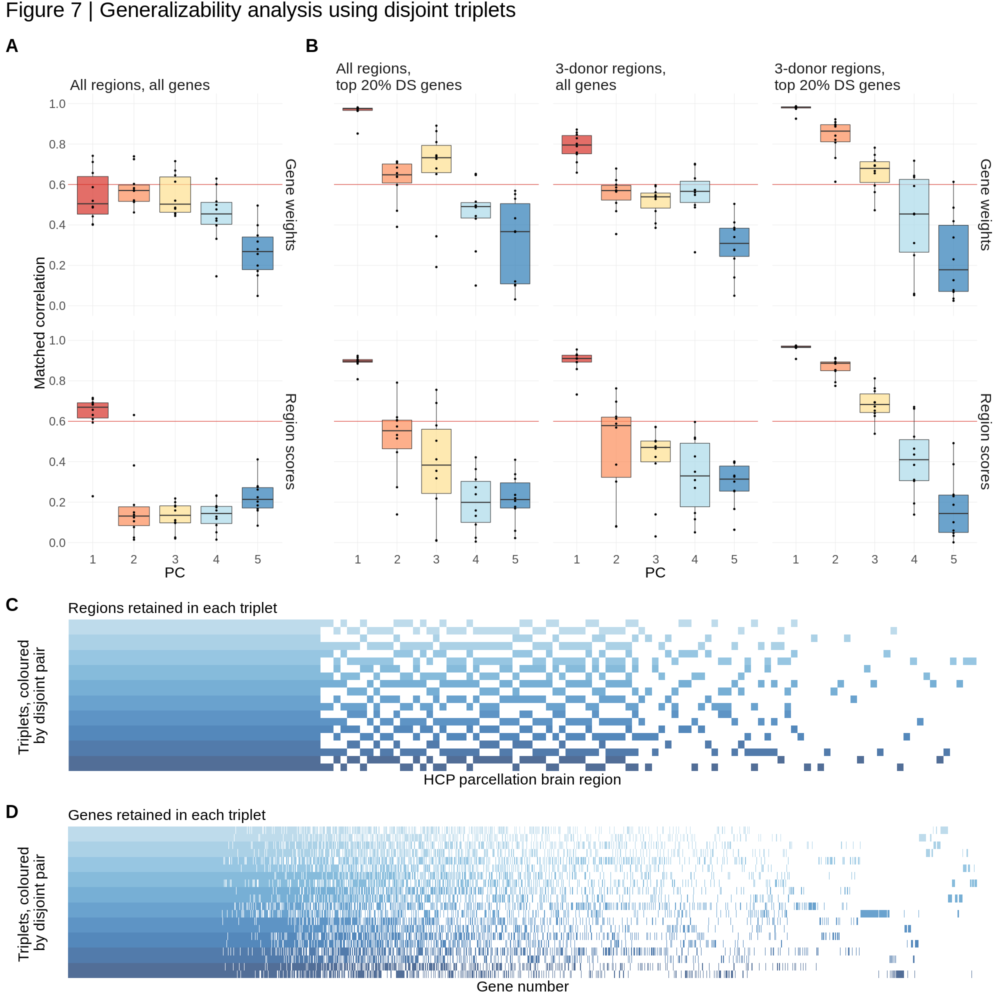

In [1832]:
%%R -w 2000 -h 2000 -i triplet_versions_hcp -i df_exist -i df_exist_regions
source("Rplots.R")

A <- plot_triplets(triplet_versions_hcp %>% filter(version=="All regions, all genes"), '')
B <- plot_triplets(triplet_versions_hcp %>% filter(version!="All regions, all genes"), '') +
        ylab("") + theme(axis.text.y=element_blank())

C <- plot_regions_exist(df_exist_regions) + xlab('HCP parcellation brain region') + ggtitle('Regions retained in each triplet') + ylab('Triplets, coloured \nby disjoint pair')
D <- plot_gene_exist(df_exist)    + ggtitle('Genes retained in each triplet') + ylab('Triplets, coloured \nby disjoint pair')
    
(
(
    ((A | B) + plot_layout(widths=c(1,3))) /
    C / D
) + plot_layout(heights=c(3,1,1)) & theme(text=element_text(size=30), plot.title=element_text(size=30))
) + plot_annotation(tag_levels='A',title='Figure 7 | Generalizability analysis using disjoint triplets', 
                    theme=theme(plot.title=element_text(size=42, hjust=0))) & theme(plot.tag=element_text(size=36, face='bold', vjust=-2))

In [1833]:
hcp_3donors_ds5.coefs.shape

(5, 7973)

In [34]:
triplet_ds8_coefs = pd.concat(
    {k:v.coefs.T for k,v in hcp_triplets_3donors_ds8.items()}
).groupby('gene_symbol').mean().T

triplet_ds8_scores = pd.concat(
    {k:v.scores for k,v in hcp_triplets_3donors_ds8.items()}
).groupby('label').mean()

triplet_ds8_coefs.columns

Index(['A1BG', 'A1BG-AS1', 'A2M', 'AAAS', 'AAED1', 'AAK1', 'AARD', 'AARS',
       'AASDH', 'AATF',
       ...
       'ZSCAN5A', 'ZSCAN5B', 'ZSCAN9', 'ZSWIM4', 'ZSWIM7', 'ZSWIM9', 'ZWINT',
       'ZYX', 'ZZEF1', 'ZZZ3'],
      dtype='object', name='gene_symbol', length=7341)

In [636]:
(hcp_base.coefs.T.iloc[:,:0]
 .join(triplet_ds8_coefs.T.iloc[:,:0].assign(retained_triplets_ds8=1))
 .join(hcp_3donors_ds5.coefs.T.iloc[:,:0].assign(retained_all6_ds5=1))
 .assign(n_genes=1, 
         retained_triplets_ds8=lambda x: x['retained_triplets_ds8'].notnull(),
         retained_all6_ds5=lambda x: x['retained_all6_ds5'].notnull()
        )
 .groupby(['retained_all6_ds5', 'retained_triplets_ds8']).sum()
 .assign(pct=lambda x: round(x/x.sum(),2))
)

n_genes   pct
retained_all6_ds5 retained_triplets_ds8               
False             False                     7241  0.45
                  True                       731  0.05
True              False                     1428  0.09
                  True                      6544  0.41

In [1740]:
hcp_3donors_dstriplets = pcaVersion(
    hcp_3donors.expression.loc[:,lambda x: np.isin(x.columns, triplet_ds8_coefs.columns)])

New PCA version


In [29]:
hcp_3donors_ds8 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.8))
hcp_3donors_ds7 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.7))
hcp_3donors_ds6 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.6))
# hcp_3donors_ds5 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.5))
hcp_3donors_ds4 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.4))
hcp_3donors_ds3 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.3))
hcp_3donors_ds2 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.2))
hcp_3donors_ds1 = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.1))
hcp_3donors = pcaVersion(get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, DS_threshold=0.0))

3190 genes remain after filtering for top 0.2 differential stability
New PCA version
4784 genes remain after filtering for top 0.3 differential stability
New PCA version
6379 genes remain after filtering for top 0.4 differential stability
New PCA version
9568 genes remain after filtering for top 0.6 differential stability
New PCA version
11162 genes remain after filtering for top 0.7 differential stability
New PCA version
12757 genes remain after filtering for top 0.8 differential stability
New PCA version
14351 genes remain after filtering for top 0.9 differential stability
New PCA version
New PCA version


In [889]:
expression, stability = get_expression_abagen(atlas=fetch_hcp(), donors_threshold=3, return_stability=True)
hcp_3donors = pcaVersion(expression)
hcp_3donors.stability = stability

15946 genes remain after filtering for top 1 differential stability
New PCA version


In [892]:
# hcp_3donors.expression.shape
hcp_3donors.stability.shape

(15946,)

In [30]:
hcp_3donors_dsRange = [hcp_3donors, hcp_3donors_ds1, hcp_3donors_ds2, hcp_3donors_ds3, 
                       hcp_3donors_ds4, hcp_3donors_ds5, hcp_3donors_ds6, hcp_3donors_ds7, hcp_3donors_ds8]

In [31]:
def corrs_with_triplet(triplet_version, other_version, how='coefs'):
    corrs={}
    for name, triplet in triplet_version.items():
        if how=='coefs':
            corrs[name] = other_version.coefs.T.corrwith(triplet.coefs.T)
        elif how=='scores':
            corrs[name] = other_version.scores.corrwith(triplet.scores)
    return pd.concat(corrs)

def make_ds_corrs(triplet_version, other_version_list, how='coefs'):
    ds_corrs = {}
    for i in range(len(other_version_list)):
        ds_corrs[i] = corrs_with_triplet(hcp_triplets_3donors_ds8, other_version_list[i], how=how)
    df_ds_corrs = (pd.concat(ds_corrs).reset_index().set_axis(['DS','triplet','PC','Corr'],axis=1)
                   .loc[lambda x: x['PC']<=2]
                   .assign(PC = lambda x: x['PC'].replace({k:f'PC{k+1}' for k in range(5)}))
                   .assign(DS = lambda x: x['DS'].replace({k:k/10 for k in range(9)}))
                   .assign(Corr = lambda x: x['Corr'].abs())
                  )
    return df_ds_corrs

In [32]:
df_ds_corrs = pd.concat({
    'Gene weights': make_ds_corrs(hcp_triplets_3donors_ds8, hcp_3donors_dsRange),
    'Region scores': make_ds_corrs(hcp_triplets_3donors_ds8, hcp_3donors_dsRange, how='scores'),
}).reset_index(level=0).rename(columns={'level_0':'how'})

In [644]:
# correlate(hcp_base.score_from(hcp_3donors_ds5), hcp_3donors_ds5.scores)
# correlate(triplet_ds8_scores, hcp_3donors_ds5.scores)
correlate(triplet_ds8_scores, hcp_base.score_from(hcp_3donors_ds5))

,0,1,2,3,4
0,0.996022,0.072182,0.006210,0.041077,-0.007089
1,-0.112386,0.957504,0.138089,0.067107,0.062972
2,0.003814,-0.214207,0.849460,0.184616,0.116923
3,-0.097586,0.073182,-0.096647,-0.178058,0.495689
4,-0.008774,0.074301,-0.039921,0.082603,0.312137


In [ ]:
def make_gene_intersection_for_plot(coefs1, coefs2):
    a = coefs1.T.iloc[:,:0].assign(a=True)
    b = coefs2.T.iloc[:,:0].assign(b=True)
    df = (a.join(b, how='outer').fillna(False).assign(both=True,only_a=lambda x: x['a'] & ~x['b'])).sum()
    out = pd.DataFrame({
        'gene':['a','b','b'], 
        'fill':['a','b','white'], 
        'values':[df['a'],df['both'],df['only_a']],
    })
    return out

# gene_intersection_dict = {}
# for pair in disjoint_triplets:
#     name = '-'.join(pair)
#     v1 = hcp_triplets_3donors_ds8[pair[0]]
#     v2 = hcp_triplets_3donors_ds8[pair[1]]
#     gene_intersection_dict[name] = make_gene_intersection_for_plot(v1.coefs,v2.coefs)

# df_gene_intersection = pd.concat(gene_intersection_dict).reset_index(level=0).rename({'level_0':'triplet'},axis=1)

In [963]:
hcp_dsrange_intersections = {}
for i,v in enumerate(hcp_3donors_dsRange):
    df = make_gene_intersection_for_plot(triplet_ds8_coefs, v.coefs)
    hcp_dsrange_intersections[i] = df.query("gene=='b'")

a=triplet_ds8_coefs.shape[1]
df_intersection = (pd.concat(hcp_dsrange_intersections)
                   .reset_index(0).rename({'level_0':'DS'},axis=1)
                   .assign(which = 'All six brains')
                   .append({'DS':8,'gene':'a','fill':'a','which':'Triplets','values':a},ignore_index=True)
#                    .sort_values('which',ascending=False)
                   .assign(which = lambda x: pd.Categorical(x['which'],categories=['Triplets', 'All six brains'], ordered=True))
                   .assign(DS = lambda x: x['DS']/10)
                  )
df_intersection

,DS,gene,fill,values,which
0,0.0,b,b,16011,All six brains
1,0.0,b,white,65,All six brains
2,0.1,b,b,14448,All six brains
3,0.1,b,white,97,All six brains
4,0.2,b,b,12906,All six brains
5,0.2,b,white,149,All six brains
6,0.3,b,b,11425,All six brains
7,0.3,b,white,263,All six brains
8,0.4,b,b,10010,All six brains
9,0.4,b,white,442,All six brains


In [962]:
gene_corrs = {}
for name, v3 in hcp_triplets_3donors_ds8.items():
    gene_corrs[name] = hcp_3donors.expression.corrwith(v3.expression)

df_gene_corrs = (
    pd.concat(gene_corrs,axis=1)
    .assign(
        mean=lambda x: x.mean(axis=1),
        max=lambda x: x.max(axis=1),
        min=lambda x: x.min(axis=1),
    )
    .join(pd.Series(hcp_3donors.stability,name='DS',index=hcp_3donors.expression.columns))
    .assign(pct = lambda x: x['DS'].rank(pct=True).pipe(lambda x: np.floor(x*10)/10))
    .groupby(['pct'])['mean']
#     .agg(['mean','count','std','max','min'])
#     .assign(hi=lambda x: 1.95*x['std']/x['count'])
    .agg(['mean', lambda x: x.quantile(.95), lambda x: x.quantile(.05)])
    .reset_index()
    .set_axis(['DS','mean','p95','p05'],axis=1)
)

In [1834]:
df_intersection

,DS,gene,fill,values,which
0,0.0,b,b,16011,All six brains
1,0.0,b,white,65,All six brains
2,0.1,b,b,14448,All six brains
3,0.1,b,white,97,All six brains
4,0.2,b,b,12906,All six brains
5,0.2,b,white,149,All six brains
6,0.3,b,b,11425,All six brains
7,0.3,b,white,263,All six brains
8,0.4,b,b,10010,All six brains
9,0.4,b,white,442,All six brains


In [1721]:
scores_hcp = (pd.concat({
    'Average over triplets \n3+ donor regions & top 20% DS genes': triplet_ds8_scores,
    'All six donors \n3+ donor regions & top 50% DS genes': hcp_3donors_ds5.score_from(hcp_3donors_ds5),
    'All six donors, projected to all regions \n3+ donor regions & top 50% DS genes': hcp_base.score_from(hcp_3donors_ds5),
})
    .groupby(level=0)
    .apply(lambda x: x/np.std(x))
    .reset_index(level=0).rename(columns={'level_0':'version'})
    .join(get_labels_hcp())
)

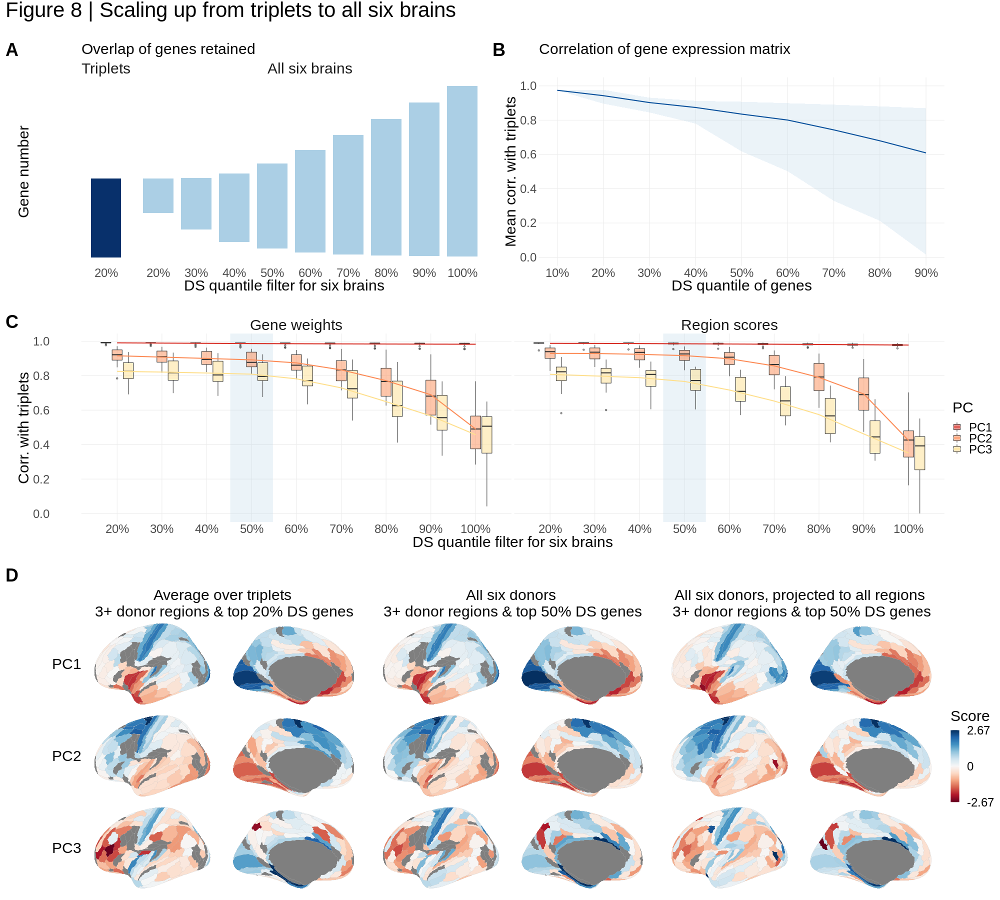

In [1733]:
%%R -w 2000 -h 1800 -i df_ds_corrs -i scores_hcp -i df_intersection -i df_gene_corrs
source("Rplots.R")
source("brainPlots.R")
library(ggplot2)
g0 <- plot_gene_intersection_2(df_intersection) + ggtitle('Overlap of genes retained')
g0x <- plot_gene_corrs(df_gene_corrs) + ggtitle('Correlation of gene expression matrix')
g1 <- plot_triplet_ds_corrs(df_ds_corrs)
g2 <- plot_hcp(scores_hcp, three=T, switch='y') + theme(legend.position='right', strip.text.y.left=element_text(angle=0)) + 
    guides(fill=guide_colorbar(title='Score', barheight=10))

(
((g0 | g0x) / g1 / g2) + plot_layout(heights=c(2,2,3)) & theme(text=element_text(size=30), strip.text=element_text(size=30), plot.title=element_text(size=30))
) + plot_annotation(tag_levels='A',title='Figure 8 | Scaling up from triplets to all six brains', 
                    theme=theme(plot.title=element_text(size=42, hjust=0))) & theme(plot.tag=element_text(size=36, face='bold', vjust=-3))

In [1744]:
def correlate(m1, m2):
    return pd.concat([m1, m2],axis=1).corr().iloc[:5,5:]

df_coefs = pd.concat({
    'vs all 6, 3+ donor regions, DS=0.8': correlate(triplet_ds8_coefs.T, hcp_3donors_ds8.coefs.T),
    'vs all 6, 3+ donor regions, DS=triplets 0.8': correlate(triplet_ds8_coefs.T, hcp_3donors_dstriplets.coefs.T),
    'vs all 6, 3+ donor regions, DS=0.5': correlate(triplet_ds8_coefs.T, hcp_3donors_ds5.coefs.T),
})

df_scores = pd.concat({
    'vs all 6, 3+ donor regions, DS=0.8': correlate(triplet_ds8_scores, hcp_3donors_ds8.scores),
    'vs all 6, 3+ donor regions, DS=triplets 0.8': correlate(triplet_ds8_scores, hcp_3donors_dstriplets.scores),
    'vs all 6, 3+ donor regions, DS=0.5': correlate(triplet_ds8_scores, hcp_3donors_ds5.scores),
})

df_corrs = (pd.concat({'coefs':df_coefs, 'scores':df_scores})
            .melt(ignore_index=False)
            .reset_index().set_axis(['how', 'version', 'x', 'y', 'corr'], axis=1)
            .assign(version = lambda x: pd.Categorical(x['version'], categories=x['version'].unique(), ordered=True))
           )

---

# Noise & robustness

In [1536]:
hcp_base_10 = pcaVersion(hcp_base.expression, k=10)

New PCA version


In [1540]:
hcp_base_10.var_test()

Computed var explained over 10 permutations


In [179]:
dk_base.var_test(p=10)
hcp_3donors_ds5.var_test(p=10)

Computed var explained over 10 permutations
Computed var explained over 10 permutations


In [192]:
df_var_test = pd.concat({
    'DK': pd.DataFrame({'True': dk_base.var, 'Permuted': dk_base.var_perm.mean(axis=0)}),
    'HCP': pd.DataFrame({'True': hcp_3donors_ds5.var, 'Permuted': hcp_3donors_ds5.var_perm.mean(axis=0)})
}).reset_index().set_axis(['atlas','PC','True','Permuted'],axis=1).melt(id_vars=['atlas','PC']).assign(PC=lambda x: x['PC']+1)
df_var_test

,atlas,PC,variable,value
0,DK,1,True,0.351888
1,DK,2,True,0.176450
2,DK,3,True,0.100225
3,DK,4,True,0.079400
4,DK,5,True,0.053995
5,HCP,1,True,0.344837
6,HCP,2,True,0.103942
7,HCP,3,True,0.078842
8,HCP,4,True,0.061348
9,HCP,5,True,0.037841


In [249]:
dk_base.bootstrap_test(q=1000)
hcp_3donors_ds5.bootstrap_test(q=1000)

Bootstrap test done
Bootstrap test done


In [289]:
df_boot_test = (pd.concat({
      'DK':pd.concat({'coefs':pd.concat(dk_base.boot_test_coefs), 'scores':pd.concat(dk_base.boot_test_scores)}),
      'HCP':pd.concat({'coefs':pd.concat(hcp_3donors_ds5.boot_test_coefs), 'scores':pd.concat(hcp_3donors_ds5.boot_test_scores)}),
}).pipe(np.abs)
 .reset_index(level=[0,1,2]).set_axis(['atlas', 'type', 'match'] + [f'PC{i+1}'for i in range(5)],axis=1)
 .melt(id_vars=['atlas', 'type', 'match'], var_name='PC', value_name='corr')
 .assign(match = lambda x: x['match'].replace({'match':'With PC matching', 'nomatch':'No PC matching'}))
               )

In [99]:
dk_base.missing_test()
hcp_3donors_ds5.missing_test()

Computed missing metrics after dropping [0.1, 0.2, 0.3, 0.4, 0.5] regions, match=True, abs mean over 40 reps
Computed missing metrics after dropping [0.1, 0.2, 0.3, 0.4, 0.5] regions, match=True, abs mean over 40 reps


In [100]:
dk_base.noise_test()
hcp_3donors_ds5.noise_test()

Computed noise metrics for betas = [0.25 0.5  0.75 1.   1.25 1.5  1.75 2.   2.25 2.5  2.75 3.   3.25 3.5
 3.75 4.   4.25 4.5  4.75 5.  ], abs mean over 10 reps
Computed noise metrics for betas = [0.25 0.5  0.75 1.   1.25 1.5  1.75 2.   2.25 2.5  2.75 3.   3.25 3.5
 3.75 4.   4.25 4.5  4.75 5.  ], abs mean over 10 reps


In [1524]:
hcp_base.noise_test()

Computed noise metrics for betas = [0.25 0.5  0.75 1.   1.25 1.5  1.75 2.   2.25 2.5  2.75 3.   3.25 3.5
 3.75 4.   4.25 4.5  4.75 5.  ], abs mean over 10 reps


In [295]:
df_noise = pd.concat({
#     'Var expl.': pd.concat({'DK': dk_base.noise_var_expl, 'HCP': hcp_3donors_ds5.noise_var_expl}),
    'Gene corr.': pd.concat({'DK': dk_base.noise_gene_corrs, 'HCP': hcp_3donors_ds5.noise_gene_corrs}),
    'Region corr.': pd.concat({'DK': dk_base.noise_score_corrs, 'HCP': hcp_3donors_ds5.noise_score_corrs})
}).reset_index().set_axis(['type', 'atlas', 'beta'] + [f'PC{i+1}'for i in range(5)],axis=1)

df_missing = pd.concat({
#     'Var expl.': pd.concat({'DK': dk_base.missing_var_expl, 'HCP': hcp_3donors_ds5.missing_var_expl}),
    'Gene corr.': pd.concat({'DK': dk_base.missing_gene_corrs, 'HCP': hcp_3donors_ds5.missing_gene_corrs}),
    'Region corr.': pd.concat({'DK': dk_base.missing_score_corrs, 'HCP': hcp_3donors_ds5.missing_score_corrs})
}).reset_index().set_axis(['type', 'atlas', 'missing'] + [f'PC{i+1}'for i in range(5)],axis=1)

In [ ]:
donors = list(files.keys())

dk_base_drop1 = {}
for d in donors:
    donors_drop1 = [don for don in donors if don != d]
    exp = get_expression_abagen(atlas=fetch_dk(), donors=donors_drop1)
    dk_base_drop1[d] = pcaVersion(exp)

hcp_3donors_ds5_drop1 = {}
for d in donors:
    donors_drop1 = [don for don in donors if don != d]
    exp = get_expression_abagen(atlas=fetch_hcp(), donors=donors_drop1,
                          donors_threshold=3, DS_threshold=0.5)
    hcp_3donors_ds5_drop1[d] = pcaVersion(exp)

New PCA version
New PCA version
New PCA version
New PCA version
New PCA version
New PCA version


In [800]:
from itertools import combinations
for pair in list(combinations(hcp_3donors_ds5_drop1,2)):
    print(hcp_3donors_ds5_drop1[pair[0]].corr_scores(hcp_3donors_ds5_drop1[pair[1]],match=True))

    match      corr  var_expl
0  (0, 0)  0.988636  0.340144
1  (1, 1)  0.722777  0.110313
2  (2, 2) -0.382785  0.078268
3  (3, 3)  0.709919  0.059963
4  (4, 4)  0.292287  0.040026
    match      corr  var_expl
0  (0, 0)  0.994997  0.343302
1  (1, 1)  0.886853  0.103642
2  (2, 2) -0.744856  0.080963
3  (3, 3)  0.809521  0.061626
4  (4, 4) -0.606193  0.038384
    match      corr  var_expl
0  (0, 0)  0.992623  0.330964
1  (1, 1)  0.910667  0.103707
2  (2, 2) -0.757441  0.081324
3  (3, 3)  0.791934  0.068569
4  (4, 4) -0.471802  0.040635
    match      corr  var_expl
0  (0, 0)  0.984958  0.334124
1  (1, 1)  0.838904  0.106741
2  (3, 2)  0.651820  0.072921
3  (2, 3) -0.762709  0.069212
4  (4, 4) -0.693290  0.041038
    match      corr  var_expl
0  (0, 0)  0.984524  0.337186
1  (1, 1) -0.693604  0.103902
2  (2, 2) -0.424599  0.075556
3  (3, 3)  0.705048  0.062324
4  (4, 4)  0.364509  0.042858
    match      corr  var_expl
0  (0, 0)  0.988506  0.345443
1  (1, 1)  0.893319  0.107572
2  (2, 2) 

In [777]:
# for name,v in dk_base_drop1.items():
#     print(dk_base.corr_scores(v))

for name,v in hcp_3donors_ds5_drop1.items():
    print(hcp_3donors_ds5.corr_scores(v))

          0         1         2         3         4
0  0.996036 -0.008357 -0.035102  0.044231 -0.005549
1  0.034824  0.842566  0.456269 -0.252457 -0.002734
2 -0.038624  0.555366 -0.640956  0.427702  0.200350
3 -0.023586 -0.040768  0.550974  0.790654 -0.067013
4 -0.005214 -0.090736  0.163239 -0.081027  0.767472
          0         1         2         3         4
0  0.996153  0.040174 -0.017761  0.010509 -0.027885
1  0.007488  0.966164  0.210952 -0.018036  0.101643
2 -0.000443 -0.174371  0.923006 -0.101790 -0.124149
3 -0.050609  0.045568  0.126180  0.937843  0.038673
4  0.073500 -0.135330  0.099901 -0.225657  0.740548
          0         1         2         3         4
0  0.996087 -0.028609  0.009743  0.027025 -0.021364
1  0.043963  0.966679 -0.176969 -0.077159 -0.014997
2  0.016059  0.183082  0.931394  0.132067  0.036942
3 -0.068414  0.123462 -0.157236  0.914203  0.013781
4 -0.032187  0.050142  0.115797 -0.061995 -0.875789
          0         1         2         3         4
0  0.995318 

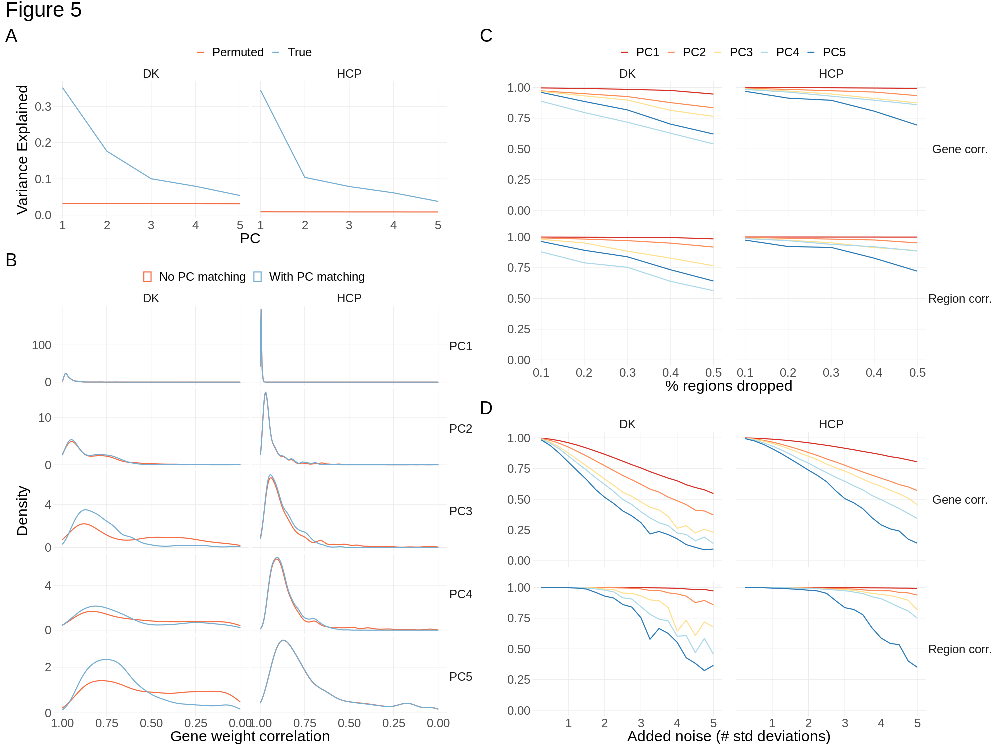

In [609]:
%%R -i df_var_test -i df_boot_test -i df_missing -i df_noise  -w 2000 -h 1500
source("Rplots.R")

g0 <- plot_var_exp(df_var_test)
g1 <- plot_boot_test(df_boot_test)
g2 <- plot_missing(df_missing)
g3 <- plot_noise(df_noise)

(
(
    ((g0 / g1) + plot_layout(heights=c(1,3))) |
    ((g2 / g3) + plot_layout(guides='collect'))
) & theme(text=element_text(size=30), legend.position='top', strip.text.y=element_text(angle=0))
) +
plot_annotation(tag_levels='A',title='Figure 5', theme=theme(plot.title=element_text(size=42, hjust=0))) & theme(plot.tag=element_text(size=36))

# Figure 7: Robustness

Intensity based filtering

In [611]:
ibf={}

ibf['dk'] = test_params(
    param='ibf_threshold', 
    params_list=[0.0, 0.3, 0.8],
    atlas=fetch_dk(), base=dk_3donors_ds5,
    donors_threshold=3, DS_threshold=0.5
)

ibf['hcp'] = test_params(
    param='ibf_threshold', 
    params_list=[0.0, 0.3, 0.8],
    atlas=fetch_hcp(), base=hcp_3donors_ds5,
    donors_threshold=3, DS_threshold=0.5
)

10116 genes remain after filtering for top 0.5 differential stability
PCA done for param = 0.0
8245 genes remain after filtering for top 0.5 differential stability
PCA done for param = 0.3
7458 genes remain after filtering for top 0.5 differential stability
PCA done for param = 0.8
10116 genes remain after filtering for top 0.5 differential stability
PCA done for param = 0.0
8245 genes remain after filtering for top 0.5 differential stability
PCA done for param = 0.3
7458 genes remain after filtering for top 0.5 differential stability
PCA done for param = 0.8


Probe selection

In [612]:
probes={}

probes['dk'] = test_params(
    param='probe_selection', 
    params_list=['rnaseq', 'max_intensity', 'mean'],
    atlas=fetch_dk(), base=dk_3donors_ds5,
    donors_threshold=3, DS_threshold=0.5
)

probes['hcp'] = test_params(
    param='probe_selection', 
    params_list=['rnaseq', 'max_intensity', 'mean'],
    atlas=fetch_hcp(), base=hcp_3donors_ds5,
    donors_threshold=3, DS_threshold=0.5
)

6892 genes remain after filtering for top 0.5 differential stability
PCA done for param = rnaseq
7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = max_intensity
7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = mean
6892 genes remain after filtering for top 0.5 differential stability
PCA done for param = rnaseq
7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = max_intensity
7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = mean


Region agg

In [245]:
# agg={}

# agg['dk'] = test_params(
#     param='region_agg',
#     params_list=['samples'],
#     atlas=fetch_dk(), base=dk_3donors_ds5,
#     donors_threshold=3, DS_threshold=0.5
# )

# agg['hcp'] = test_params(
#     param='region_agg',
#     params_list=['samples'],
#     atlas=fetch_hcp(), base=hcp_3donors_ds5,
#     donors_threshold=3, DS_threshold=0.5
# )

ValueError: Cannot return donor-level expresison data when region_agg parameter is set to "samples".

LR mirror

In [613]:
lr={}

lr['dk'] = test_params(
    param='lr_mirror',
    params_list=[None],
    atlas=fetch_dk(), base=dk_3donors_ds5,
    donors_threshold=3, DS_threshold=0.5
)

lr['hcp'] = test_params(
    param='lr_mirror',
    params_list=[None],
    atlas=fetch_hcp(), base=hcp_3donors_ds5,
    donors_threshold=3, DS_threshold=0.5
)

8005 genes remain after filtering for top 0.5 differential stability
PCA done for param = None
8005 genes remain after filtering for top 0.5 differential stability
PCA done for param = None


Gene normalization

In [614]:
gene_norm={}

gene_norm['dk'] = test_params(
    param='gene_norm',
    params_list=['zscore', 'center'],
    atlas=fetch_dk(), base=dk_3donors_ds5,
    donors_threshold=3, DS_threshold=0.5
)

gene_norm['hcp'] = test_params(
    param='gene_norm',
    params_list=['zscore', 'center'],
    atlas=fetch_hcp(), base=hcp_3donors_ds5,
    donors_threshold=3, DS_threshold=0.5
)

7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = zscore
7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = center
7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = zscore
7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = center


Distance tolerance

In [615]:
tol={}

tol['dk'] = test_params(
    param='tolerance',
    params_list=[0, 1, 3],
    atlas=fetch_dk(), base=dk_3donors_ds5,
    donors_threshold=3, DS_threshold=0.5
)

tol['hcp'] = test_params(
    param='tolerance',
    params_list=[0, 1, 3],
    atlas=fetch_hcp(), base=hcp_3donors_ds5,
    donors_threshold=3, DS_threshold=0.5
)

7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = 0
7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = 1
7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = 3
7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = 0
7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = 1
7973 genes remain after filtering for top 0.5 differential stability
PCA done for param = 3


Differential stability

In [616]:
ds={}

ds['dk'] = test_params(
    param='DS_threshold', 
    params_list=[0, .1, .3, .8],
    atlas=fetch_dk(), base=dk_3donors_ds5,
    donors_threshold=3#, DS_threshold=0.5
)

ds['hcp'] = test_params(
    param='DS_threshold', 
    params_list=[0, .1, .3, .8],
    atlas=fetch_hcp(), base=hcp_3donors_ds5,
    donors_threshold=3#, DS_threshold=0.5
)

PCA done for param = 0
14351 genes remain after filtering for top 0.9 differential stability
PCA done for param = 0.1
11162 genes remain after filtering for top 0.7 differential stability
PCA done for param = 0.3
3190 genes remain after filtering for top 0.2 differential stability
PCA done for param = 0.8
PCA done for param = 0
14351 genes remain after filtering for top 0.9 differential stability
PCA done for param = 0.1
11162 genes remain after filtering for top 0.7 differential stability
PCA done for param = 0.3
3190 genes remain after filtering for top 0.2 differential stability
PCA done for param = 0.8


In [617]:
versions_dict = {
    'Intensity filter \n(default = 0.5)': ibf,
    'Probe aggregation \n(default = differential stability)': probes,
    'Mirror right hemisphere \n(default = yes)': lr,
    'Distance tolerance \n(default = 2)': tol,
    'Gene normalization \n(default = scaled robust sigmoid)': gene_norm,
    'Differential stability threshold \n(default = 0.5)': ds,
}

def get_version_corrs(versions_dict, atlas='dk', which='coef_corrs'):
    df_corrs = (
        pd.concat({k:v[atlas][which] for k,v in versions_dict.items()})
        .reset_index().set_axis(['param', 'p'] + [f'{i+1}' for i in range(5)], axis=1)
        .assign(p=lambda x: x['p'].astype('str'))
    )
    return df_corrs

df_versions_dk = pd.concat({
    'Gene weights': get_version_corrs(versions_dict, 'dk', 'coef_corrs'), 
    'Region scores': get_version_corrs(versions_dict, 'dk', 'score_corrs')
}).reset_index(level=0).rename(columns={'level_0':'type'})

df_versions_hcp = pd.concat({
    'Gene weights': get_version_corrs(versions_dict, 'hcp', 'coef_corrs'), 
    'Region scores': get_version_corrs(versions_dict, 'hcp', 'score_corrs')
}).reset_index(level=0).rename(columns={'level_0':'type'})

In [1251]:
ibf['hcp']['versions'][0.8].corr_coefs(hcp_3donors_ds5).round(3)

,0,1,2,3,4
0,0.998,0.011,-0.002,-0.033,-0.005
1,-0.011,-0.880,0.384,-0.143,0.049
2,0.000,0.701,0.660,0.013,0.085
3,0.007,0.124,-0.847,0.153,0.239
4,-0.006,-0.034,0.072,0.966,-0.155


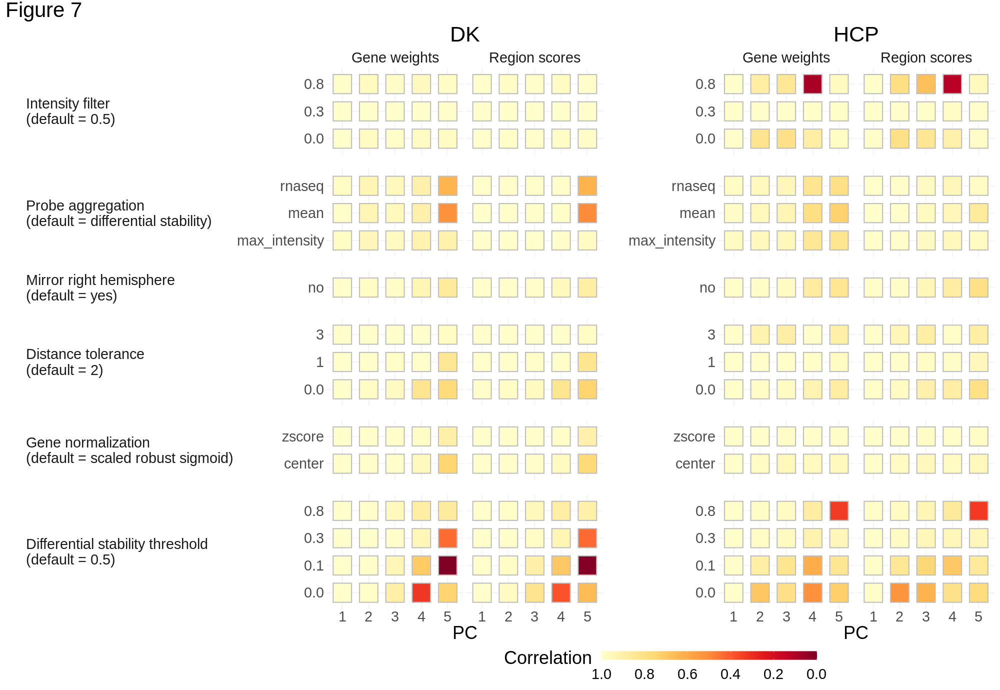

In [1497]:
%%R -i df_versions_dk -i df_versions_hcp -w 2000 -h 1380
# library(viridis)
library(pals)

plot_corrs <- function(df_versions) {
    df_versions %>%
    mutate(p=replace(p,p=='nan','no')) %>%
    gather(PC, corr, -type, -param, -p) %>%
    mutate(corr = abs(corr)) %>%
    mutate(highlight = factor(ifelse(corr<.8,'<0.8','>0.8'))) %>%
    mutate_at(vars(param), ~ factor(., levels=unique(.))) %>% 
    ggplot() +
    geom_tile(aes(y=p, x=PC, fill=corr), color='grey', width=.7, height=.7, size=1) +
    facet_grid(param~type, scale='free', space='free', switch='y') +
    theme_minimal() +
    theme(strip.text.y.left = element_text(angle = 0), 
          axis.title.y.left = element_text(vjust = -10),
          strip.placement = "outside",
          plot.title = element_text(hjust=.5)
         ) +
    scale_fill_gradientn(colors=rev(brewer.ylorrd(100)), limits=c(0,1), breaks=seq(0,1,.2)) +
#     scale_fill_viridis(option='magma', limits=c(0,1), breaks=seq(0,1,.2)) +
    scale_color_manual(values=c(brewer.ylorrd(10)[9],'grey'), guide=guide_legend(title='')) +
    guides(fill=guide_colorbar(title="Correlation", barwidth=30, reverse=T, title.hjust=-.1, title.vjust=1)) +
#            color=guide_legend(title=NULL)) +
    ylab('') + xlab('PC')
}

g1 <- plot_corrs(df_versions_dk) + ggtitle('DK') + theme(strip.text.y.left=element_text(hjust=0))
g2 <- plot_corrs(df_versions_hcp) + theme(strip.text.y.left=element_blank()) + ggtitle('HCP')

((g1 | g2) + plot_layout(guides='collect') & theme(text=element_text(size=36), legend.position = "bottom", panel.spacing.y=unit(2,'lines'))) + 
plot_annotation(title='Figure 7', theme=theme(plot.title=element_text(size=42)))

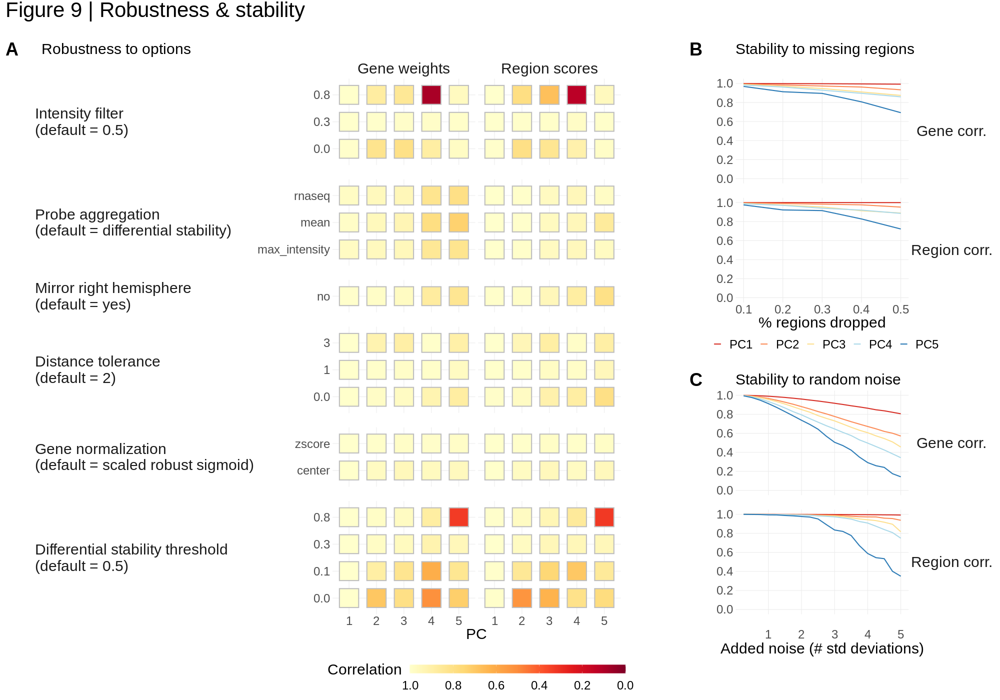

In [1825]:
%%R -i df_versions_hcp -i df_missing -i df_noise -w 2000 -h 1400

source("Rplots.R")

A <- plot_robustness(df_versions_hcp) + ggtitle('Robustness to options') + theme(plot.title=element_text(size=30, hjust=-2.1))
B <- plot_missing(df_missing) + ggtitle('Stability to missing regions') + theme(legend.position='bottom')
C <- plot_noise(df_noise) + ggtitle('Stability to random noise') + guides(color='none')

(
    (A | plot_spacer() | (B / C)) + plot_layout(widths=c(5,1,3)) & 
    theme(text=element_text(size=30), panel.spacing.y=unit(2,'lines'), plot.title=element_text(size=30))    
) + plot_annotation(tag_levels='A',title='Figure 9 | Robustness & stability',
                theme=theme(plot.title=element_text(size=42, hjust=0))) & theme(plot.tag=element_text(size=36, face='bold', vjust=-2.8))

# Spatial associations

In [665]:
HCPmappings = pd.read_csv("vonEconomo_Yeo.csv")

In [976]:
df.Lobe.unique()

array(['Occ', 'Fr', 'Par', 'Temp', 'Ins'], dtype=object)

In [1456]:
# Lobe_cols = ["#E41A1C", "#377EB8", "#4DAF4A", "#984EA3", "#FF7F00"]
Lobe_colors = {'Fr':"#377EB8", 'Ins':"#E41A1C", 'Occ':"#4DAF4A", 'Par':"#984EA3", 'Temp':"#FF7F00"}
vonEconomo_labels = {1:'motor',2:'association',3:'association',4:'sensory',5:'sensory',6:'limbic',7:'insula'}
Yeo_labels = {1:'visual',2:'somatomotor',3:'dorsal attention',4:'ventral attention',5:'limbic',6:'frontoparietal',7:'default mode'}

df = (
 hcp_base.score_from(hcp_3donors_ds5)
 .apply(lambda x: x/np.std(x))
 .set_axis(['PC'+str(i+1) for i in range(5)],axis=1)
 .join(get_labels_hcp())
 .assign(L_label = lambda x: ['L_' + l for l in x['label']])
 .join(HCPmappings.set_index('HCP'), on='L_label')
 .join(fetch_hcp()['info'].set_index('id')[['Lobe','x-cog','y-cog','z-cog']])
 .rename({'x-cog':'x','y-cog':'y','z-cog':'z'},axis=1)
 .assign(Lobecolors = lambda x: x['Lobe'].map(Lobe_colors))
 .assign(vonEconomo_labels = lambda x: x['vonEconomo'].map(vonEconomo_labels))
 .assign(Yeo_labels = lambda x: x['Yeo'].map(Yeo_labels))
)
df

,PC1,PC2,PC3,PC4,PC5,label,L_label,Yeo,vonEconomo,vonEconomo.colors,...,pos_all1,pos_all2,pos_all3,Lobe,x,y,z,Lobecolors,vonEconomo_labels,Yeo_labels
label,,,,,,,,,,,,,,,,,,,,,
1,2.517525,-1.836954,0.856717,-0.905540,1.167856,V1,L_V1,1.0,5.0,#fffb00,...,11.2100,49.8160,35.575,Occ,100.491589,41.138901,71.637040,#4DAF4A,sensory,visual
2,1.700594,-0.230562,-0.550019,-0.863003,2.408162,MST,L_MST,1.0,4.0,#f59505,...,36.2500,34.0110,37.570,Occ,132.416667,58.901786,82.059524,#4DAF4A,sensory,visual
3,0.931374,0.867739,-2.782380,-2.770269,0.941273,V6,L_V6,1.0,4.0,#f59505,...,10.0960,35.7500,55.243,Occ,104.543112,44.481665,103.916749,#4DAF4A,sensory,visual
4,2.117067,-1.289230,0.589364,-0.558791,0.743331,V2,L_V2,1.0,4.0,#f59505,...,11.1790,46.8900,36.613,Occ,102.236656,44.064791,74.401125,#4DAF4A,sensory,visual
5,2.142329,-1.542489,0.466002,-0.380379,0.957421,V3,L_V3,1.0,4.0,#f59505,...,14.5800,47.8790,37.700,Occ,107.926111,40.632159,76.961153,#4DAF4A,sensory,visual
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,-0.825026,-0.545053,0.444711,0.221802,-0.598584,STSva,L_STSva,7.0,2.0,#220ced,...,47.7880,-20.2020,23.128,Temp,142.689243,118.134462,52.832669,#FF7F00,association,default mode
177,-0.872309,-0.151163,-0.447481,-0.007253,-0.732691,TE1m,L_TE1m,7.0,2.0,#220ced,...,56.7780,-7.0496,23.176,Temp,155.554922,101.395287,54.901178,#FF7F00,association,default mode
178,-1.204328,-0.980589,0.143315,-1.276588,-0.455797,PI,L_PI,4.0,3.0,#067a08,...,39.7870,-28.6810,22.045,Temp,134.650549,124.293407,56.102198,#FF7F00,association,ventral attention


In [667]:
# scores_hcp_wide = hcp_abagen.score_from(hcp_abagen_5, labels=get_labels_hcp()).drop([3,4],axis=1)
# scores_hcp_wide = scores_projected_std.join(get_labels_hcp()).drop([3,4],axis=1)
# scores_hcp_wide = hcp_3donors_ds8.scores.apply(lambda x: x/np.std(x)).join(get_labels_hcp()).drop([3,4],axis=1)
# scores_hcp_wide = hcp_3donors_ds5.scores.apply(lambda x: x/np.std(x)).join(get_labels_hcp()).drop([3,4],axis=1)
# scores_hcp_wide = ((hcp_basic.expression.loc[:, hcp_3donors_ds8.coefs.columns] @ hcp_3donors_ds8.coefs.T)
#  .apply(lambda x: x/np.std(x)).join(get_labels_hcp()).drop([3,4],axis=1))
scores_hcp_wide = hcp_base.score_from(hcp_3donors_ds5).apply(lambda x: x/np.std(x)).join(get_labels_hcp()).drop([3,4],axis=1)

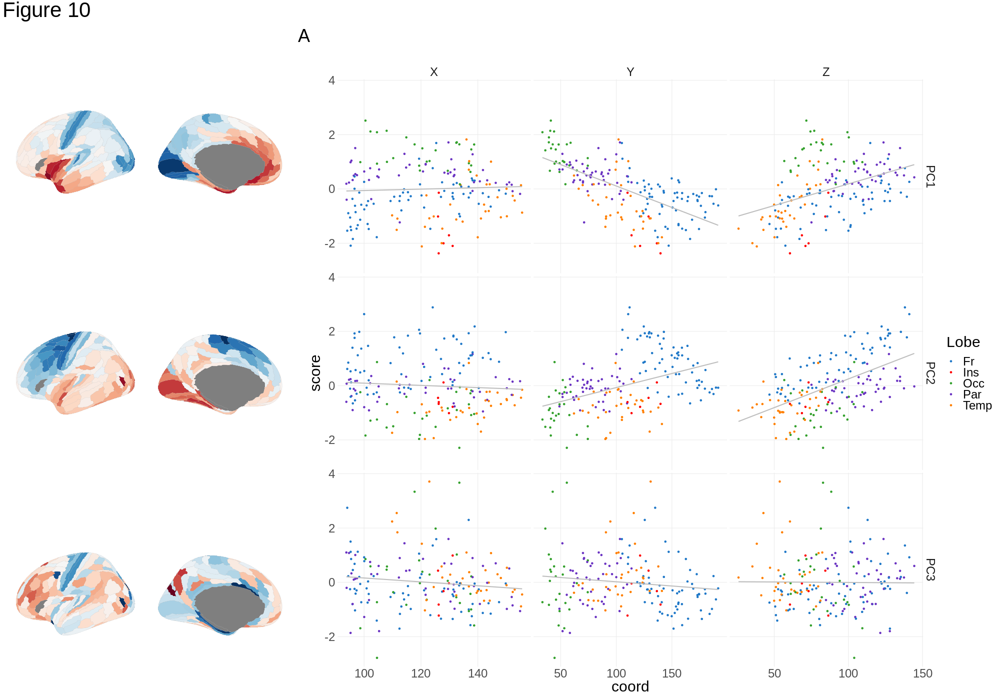

In [688]:
%%R -w 2000 -h 1400 -i df -i scores_hcp_wide
source("Rplots.R")
source("brainPlots.R")

g1 <- plot_hcp_wide(scores_hcp_wide, facet='v', spacing=18) + guides(fill='none')
g2 <- plot_xyz(df)

(
    (g1 + plot_layout(tag_level='new') | g2) + plot_layout(widths=c(1,2)) & theme(text=element_text(size=30))
) + plot_annotation(tag_levels='A',title='Figure 10', theme=theme(plot.title=element_text(size=42))) & theme(plot.tag=element_text(size=36))

In [983]:
Lobe_colors.values()

dict_values(['#377EB8', '#E41A1C', '#4DAF4A', '#984EA3', '#FF7F00'])

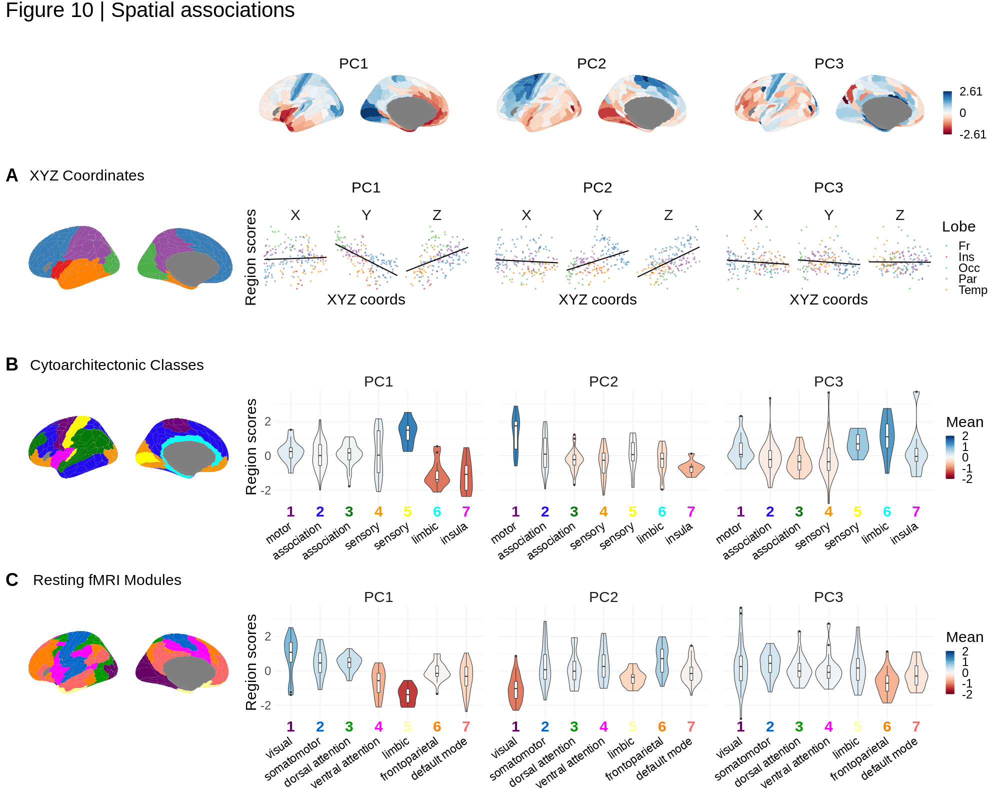

In [1835]:
%%R -w 2000 -h 1600 -i df -i scores_hcp_wide

source("Rplots.R")
Lobe_colors = c('#377EB8', '#E41A1C', '#4DAF4A', '#984EA3', '#FF7F00')
g0 <- plot_hcp_classes(df, classes=Lobe, classcolors=Lobecolors) + ggtitle('XYZ Coordinates') + theme(plot.title=element_text(size=30, hjust=0.1))
g01 <- plot_xyz(df, PC1, 'PC1', colors=Lobe_colors)
g02 <- plot_xyz(df, PC2, 'PC2', colors=Lobe_colors)
g03 <- plot_xyz(df, PC3, 'PC3', colors=Lobe_colors)

g1 <- plot_hcp_classes(df, vonEconomo, vonEconomo.colors) + ggtitle('Cytoarchitectonic Classes') + theme(plot.title=element_text(size=30, hjust=0.25))
g1x <- plot_violins(df, vonEconomo, vonEconomo.colors, vonEconomo_labels)
g2 <- plot_hcp_classes(df, Yeo, Yeo.colors) + ggtitle('Resting fMRI Modules') + theme(plot.title=element_text(size=30, hjust=0.2))
g2x <- plot_violins(df, Yeo, Yeo.colors, Yeo_labels)

source("brainPlots.R")
g5 <- plot_hcp_wide(scores_hcp_wide)

(
    ((plot_spacer() | g5 + plot_layout(tag_level='new')) + plot_layout(widths=c(1,3)) ) /     
    ((g0 | ((g01|g02|g03) & plot_layout(tag_level='new'))) + plot_layout(widths=c(1,3),guides='collect') ) /
    ((g1 | g1x + plot_layout(tag_level='new')) + plot_layout(widths=c(1,3)) ) / 
    ((g2 | g2x + plot_layout(tag_level='new')) + plot_layout(widths=c(1,3)) ) /
    plot_spacer() & theme(text=element_text(size=30), strip.text=element_text(size=30))
) + plot_layout(heights=c(3,4,4,4,1)) +
    plot_annotation(tag_levels='A',title='Figure 10 | Spatial associations',
                theme=theme(plot.title=element_text(size=42, hjust=0))) & theme(plot.tag=element_text(size=36, face='bold', vjust=-3.4))

# Figure 5: Genetic associations

In [1006]:
hcp_3donors_ds5.coefs.T

,0,1,2,3,4
gene_symbol,,,,,
A1BG,-0.015087,-0.005032,0.002124,-0.017010,0.007609
A1BG-AS1,-0.011854,-0.003594,-0.012457,-0.012052,-0.011750
AAAS,0.011607,0.007599,0.001710,-0.023055,-0.008191
AAED1,-0.013758,0.000270,0.009306,-0.007360,0.002186
AAGAB,-0.005162,0.015516,-0.020450,-0.006370,0.009079
...,...,...,...,...,...
ZSWIM9,-0.010554,0.000093,0.008469,0.010812,-0.017530
ZWINT,-0.012190,-0.006516,0.000142,-0.010271,-0.015469
ZYX,0.016868,0.007031,-0.008057,-0.008065,-0.006325


In [1060]:
df_gene_t1t2 = (
    pd.read_csv("Burt_T1T2.csv").iloc[:,:2].set_axis(['gene_symbol','t1t2'],axis=1).set_index('gene_symbol')
    .sort_values('gene_symbol')
    .join(hcp_3donors_ds5.coefs.T)
    .iloc[:,:4]
    .set_axis(['t1t2'] + [f'PC{i+1}' for i in range(3)],axis=1)
    .reset_index()
    .melt(id_vars=['gene_symbol', 't1t2'], var_name='PC', value_name='weight')
)
df_gene_t1t2

,gene_symbol,t1t2,PC,weight
0,1-Mar,-0.57,PC1,NaN
1,10-Sep,0.25,PC1,NaN
2,11-Mar,0.28,PC1,NaN
3,11-Sep,-0.36,PC1,NaN
4,12-Sep,0.68,PC1,NaN
...,...,...,...,...
48259,ZYG11B,-0.08,PC3,NaN
48260,ZYX,0.67,PC3,-0.008057
48261,ZZEF1,0.73,PC3,0.013359
48262,ZZZ3,-0.29,PC3,0.006720


In [1255]:
# li_genes = pd.read_csv("li_genes.csv",header=None).loc[:,0].dropna()
# burt_genes = ['CORT','CALB1','SST','PVALB','CCK','NPY','PNOC','CALB2','VIP','GRIN','GRIN2B','GABRA']
burt_genes = ['CALB1','SST','PVALB''CALB2','GRIN2B','GABRA']
# burt_genes = pd.read_csv("Burt_genes.csv",header=None).loc[:,0].dropna()
df_burt_genes = (
    hcp_3donors_ds5.coefs.T
    .iloc[:,:3]
    .set_axis([f'PC{i+1}' for i in range(3)], axis=1)
    .assign(burt = lambda x: np.isin(x.index, burt_genes))
    .reset_index()
    .melt(id_vars=['burt', 'gene_symbol'], var_name='PC', value_name='weight')
    .assign(rank = lambda x: x.groupby('PC')['weight'].rank())
    .assign(side = lambda x: x.index % 2)
)
df_burt_genes

,burt,gene_symbol,PC,weight,rank,side
0,False,A1BG,PC1,-0.015087,661.0,0
1,False,A1BG-AS1,PC1,-0.011854,1891.0,1
2,False,AAAS,PC1,0.011607,6427.0,0
3,False,AAED1,PC1,-0.013758,1152.0,1
4,False,AAGAB,PC1,-0.005162,3524.0,0
...,...,...,...,...,...,...
23914,False,ZSWIM9,PC3,0.008469,6384.0,0
23915,False,ZWINT,PC3,0.000142,4436.0,1
23916,False,ZYX,PC3,-0.008057,2223.0,0
23917,False,ZZEF1,PC3,0.013359,7118.0,1


In [1816]:
# pd.Series(hcp_3donors.stability,name='DS',index=hcp_3donors.expression.columns)
df_stability = (hcp_3donors_ds5.coefs.T
 .iloc[:,:3]
 .set_axis([f'PC{i+1}' for i in range(3)],axis=1)
 .join(pd.Series(hcp_3donors.stability,name='DS',index=hcp_3donors.expression.columns))
 .reset_index()
 .melt(id_vars=['gene_symbol', 'DS'], var_name='PC', value_name='weight')
#  .assign(weight = lambda x: x['weight'].abs())
)
df_stability

,gene_symbol,DS,PC,weight
0,A1BG,0.424149,PC1,-0.015087
1,A1BG-AS1,0.182490,PC1,-0.011854
2,AAAS,0.239376,PC1,0.011607
3,AAED1,0.230713,PC1,-0.013758
4,AAGAB,0.133505,PC1,-0.005162
...,...,...,...,...
23914,ZSWIM9,0.216755,PC3,0.008469
23915,ZWINT,0.264731,PC3,0.000142
23916,ZYX,0.550477,PC3,-0.008057
23917,ZZEF1,0.208672,PC3,0.013359


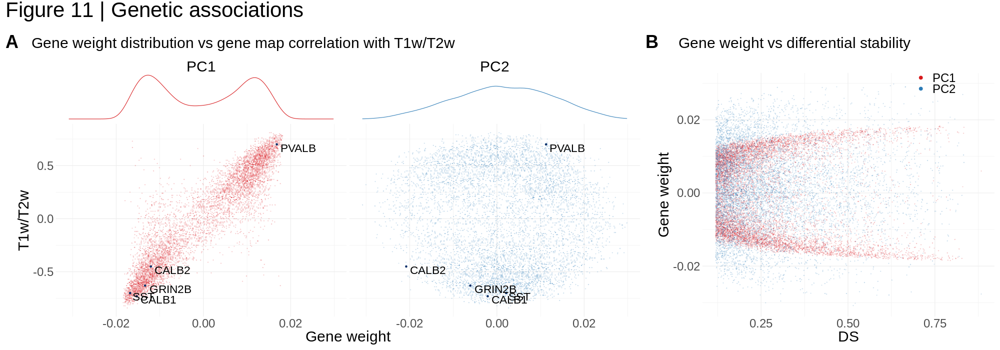

In [1822]:
%%R -i df_gene_t1t2 -i df_stability -w 2000 -h 700

# mycolors <- c(brewer.rdylbu(6)[1:3],brewer.rdylbu(5)[4:5])
mycolors <- brewer.rdylbu(5)[c(1,5)]

burt_genes <- c('CALB1','SST','PVALB','CALB2','GRIN2B','GABRA')
df_gene_t1t2_burt <- df_gene_t1t2 %>% filter(gene_symbol %in% burt_genes, PC!='PC3')

g1 <- ggplot(df_gene_t1t2 %>% filter(PC!='PC3')) + 
facet_wrap(~PC) +
geom_density(aes(x=weight, color=PC), alpha=.3) +
scale_color_manual(values=mycolors, guide='none') +
theme_void() + 
theme(strip.text=element_text(size=30), plot.title=element_text(size=30, vjust=4, hjust=-.15)) +
ggtitle('Gene weight distribution vs gene map correlation with T1w/T2w')

g2 <- ggplot(df_gene_t1t2 %>% filter(PC!='PC3')) + 
facet_wrap(~PC) +
geom_point(aes(x=weight,y=t1t2, color=PC), alpha=.15, size=.5) +
geom_point(aes(x=weight,y=t1t2), color=brewer.blues(10)[10], data=df_gene_t1t2_burt) +
geom_text(aes(x=weight,y=t1t2,label=gene_symbol), data=df_gene_t1t2_burt, hjust=-0.1, vjust=1, size=8) +
scale_color_manual(values=mycolors, guide='none') +
ylab("T1w/T2w") + #ylim(c(-1,1)) +
xlab("Gene weight") +
theme_minimal() +
theme(strip.text=element_blank())


# mycolors <- brewer.rdylbu(6)[c(1,3,6)]
g3 <- ggplot(df_stability %>% filter(PC!='PC3')) + 
geom_point(aes(x=DS,y=weight,color=PC), alpha=.15, size=.5) + 
scale_color_manual(values=mycolors, name='') +
guides(color=guide_legend(override.aes = list(alpha = 1, size = 3))) +
ylab('Gene weight') +
theme_minimal() +
theme(legend.position=c(.8,1), plot.title=element_text(size=30, vjust=3, hjust=-.4)) +
ggtitle('Gene weight vs differential stability')

(
    (((g1 / (g2 + plot_layout(tag_level='new'))) + plot_layout(heights=c(1,4))) | g3) + plot_layout(widths=c(2,1)) & 
    theme(text=element_text(size=30))
) + plot_annotation(tag_levels='A',title='Figure 11 | Genetic associations', 
                    theme=theme(plot.title=element_text(size=42))) & theme(plot.tag=element_text(size=36, face='bold', vjust=-1))

In [42]:
gene_list={}
for i in range(5):
    gene_list[f'PC{i+1}']=hcp_3donors.coefs.T.sort_values([i], ascending=True).index
pd.DataFrame(gene_list).to_csv("genes_ds0_asc.csv")

In [1728]:
gene_list={}
for i in range(5):
    gene_list[f'PC{i+1}']=hcp_3donors_ds5.coefs.T.apply(abs).sort_values([i], ascending=False).index
pd.DataFrame(gene_list).to_csv("ahba_pca_genes_absolute_3donor_ds5.csv")

In [55]:
gene_list={}
for i in range(5):
    gene_list[f'PC{i+1}']=hcp_3donors_ds5.coefs.T.sort_values([i], ascending=True).iloc[:,i].apply(lambda x: -x).reset_index()
pd.concat(gene_list,axis=1).droplevel(axis=1,level=1).to_csv("genes_ds5_asc_weights.csv")

---

# Ranked brain maps (compare to Jakob brain weight)

In [83]:
hcp_base.score_from(hcp_3donors_ds5).set_axis([f'PC{i+1}' for i in range(5)],axis=1).join(get_labels_hcp()).rename_axis('id').reset_index().to_csv('HCP_scores_ds5.csv')

In [34]:
hcp_ranks = pd.concat({
    'PC ranks +': hcp_base.score_from(hcp_3donors_ds5).apply(lambda x: x.rank()),
    'PC ranks -': hcp_base.score_from(hcp_3donors_ds5).apply(lambda x: x.rank(ascending=False))
}).reset_index(0).rename({'level_0':'version'},axis=1).join(get_labels_hcp())
hcp_ranks

,version,0,1,2,3,4,label
1,PC ranks +,177.0,5.0,147.0,28.0,165.0,V1
1,PC ranks -,1.0,173.0,31.0,150.0,13.0,V1
2,PC ranks +,169.0,78.0,50.0,30.0,175.0,MST
2,PC ranks -,9.0,100.0,128.0,148.0,3.0,MST
3,PC ranks +,146.0,143.0,1.0,1.0,154.0,V6
...,...,...,...,...,...,...,...
178,PC ranks -,155.0,152.0,71.0,161.0,124.0,PI
179,PC ranks +,20.0,151.0,162.0,54.0,61.0,a32pr
179,PC ranks -,158.0,27.0,16.0,124.0,117.0,a32pr
180,PC ranks +,12.0,107.0,148.0,91.0,158.0,p24


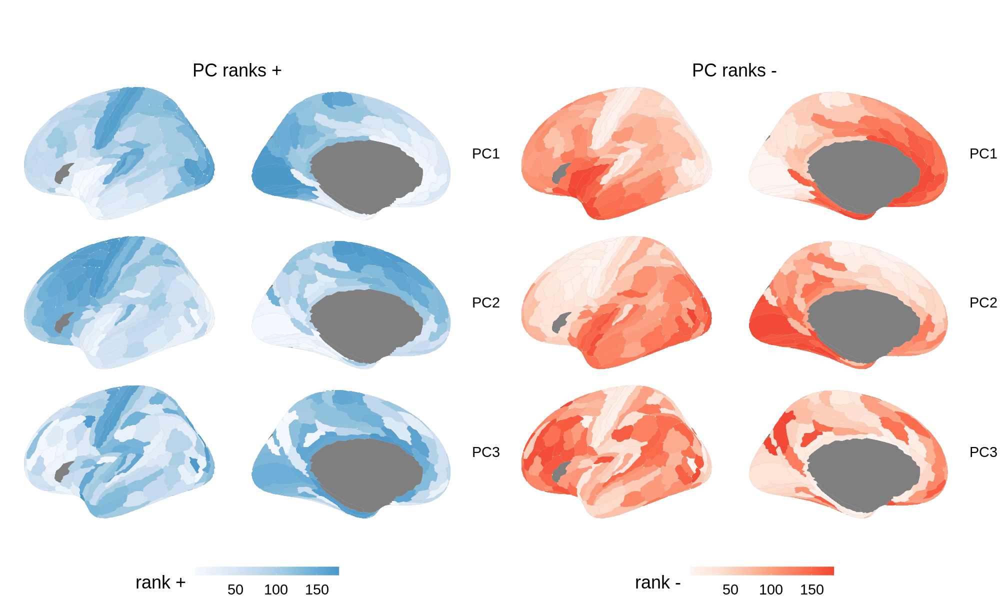

In [61]:
%%R -i hcp_ranks -w 2000 -h 1200
source("brainPlots.R")

g1 <- plot_hcp_ranks(hcp_ranks %>% filter(version=='PC ranks +'), three=T) + scale_fill_gradientn(name='rank +', colors=brewer.blues(100)[1:60])
g2 <- plot_hcp_ranks(hcp_ranks %>% filter(version=='PC ranks -'), three=T) + scale_fill_gradientn(name='rank -', colors=brewer.reds(100)[1:60])

(g1 | g2) & theme(text=element_text(size=36), strip.text.x=element_text(size=36), panel.spacing.x=unit(2,'lines')) & guides(fill=guide_colorbar(barwidth=20))

---

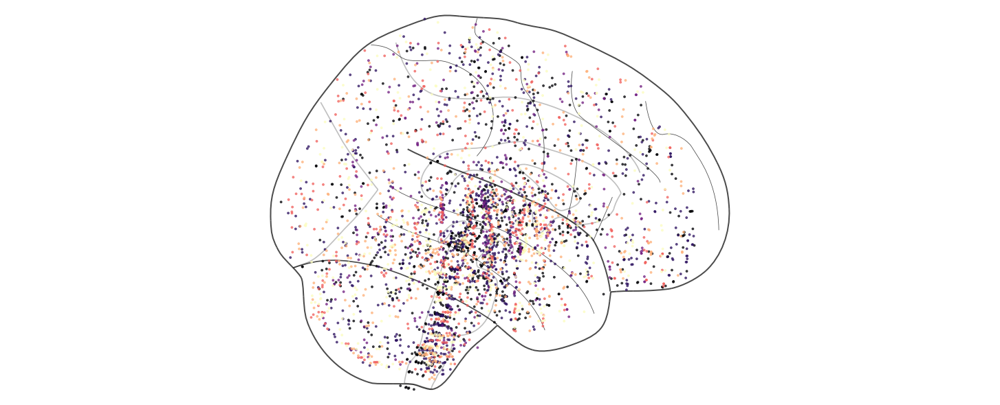

In [388]:
from abagen import samples_
for donor, data in files.items():
    data['annotation'] = samples_.update_coords(data['annotation'], corrected_mni=True)

annotation_updated = pd.concat({donor:data['annotation'] for donor, data in files.items()})

plot_coords(annotation_updated, 'coords')

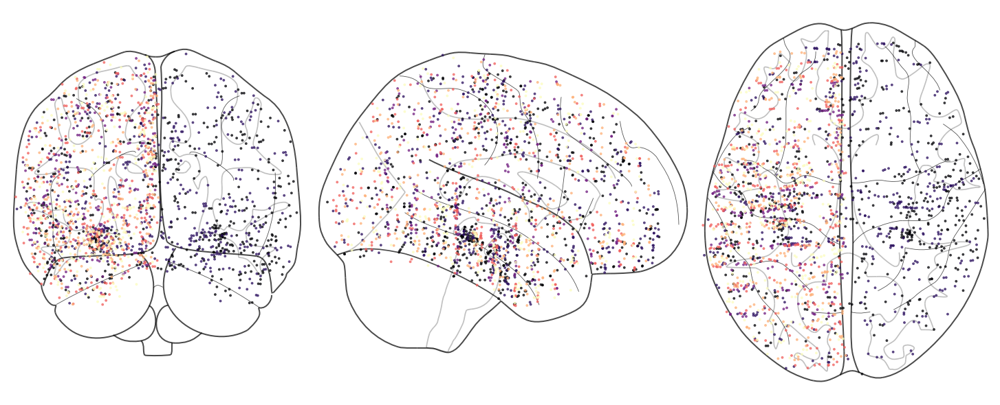

In [663]:
cx_list = pd.read_csv('../analysis/StructureList_KWedit.txt', sep='\t')

annotation_cx = (annotation_updated
 .loc[lambda x: x['slab_type'] == 'CX']
 .join(cortical_list.set_index('structure_name'), on='structure_name')
 .loc[lambda x: x['cortical'] == 1]
#  .loc[lambda x: ~(x['structure_name'].str.contains('hippo'))]
)

plot_coords(annotation_cx, 'coords_cx')

In [6]:
dk_aurina.var_test(10)
hcp_aurina.var_test(10)

Computed var explained over 10 permutations
Computed var explained over 10 permutations


In [33]:
plot_var = plot_var_exp(dk_aurina, hcp_aurina, return_plot=False)

In [1411]:
scores_dk = dk_aurina.score_from(dk_aurina, labels=get_labels_dk()).assign(version='DK')
scores_hcp = hcp_aurina.score_from(hcp_aurina, labels=get_labels_hcp(), invert=[0,3,4]).assign(version='HCP')

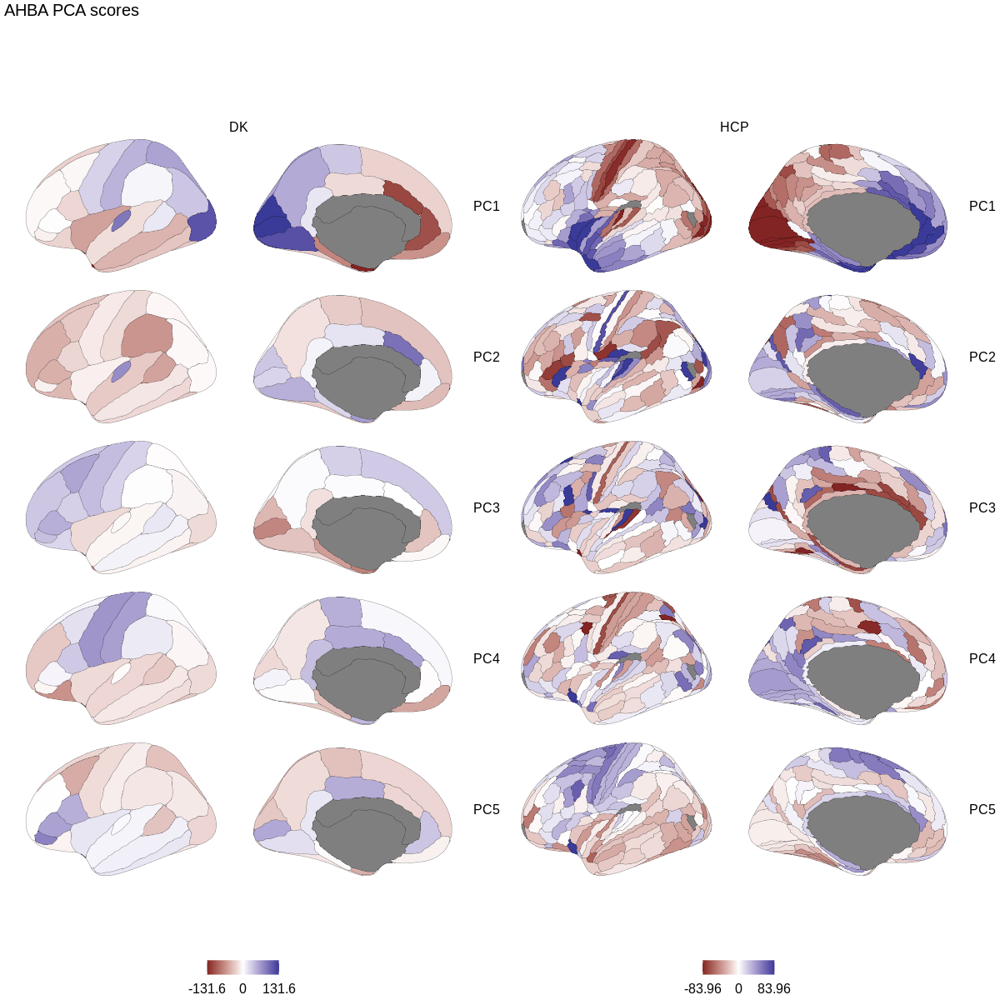

In [10]:
%%R -i scores_dk -i scores_hcp -w 1200 -h 1200
source("brainPlots.R")
(plot_dk(scores_dk) + plot_hcp(scores_hcp) + 
 plot_annotation(title='AHBA PCA scores', theme=theme(plot.title=element_text(size=20))))

# Fig 2: Sample Distribution

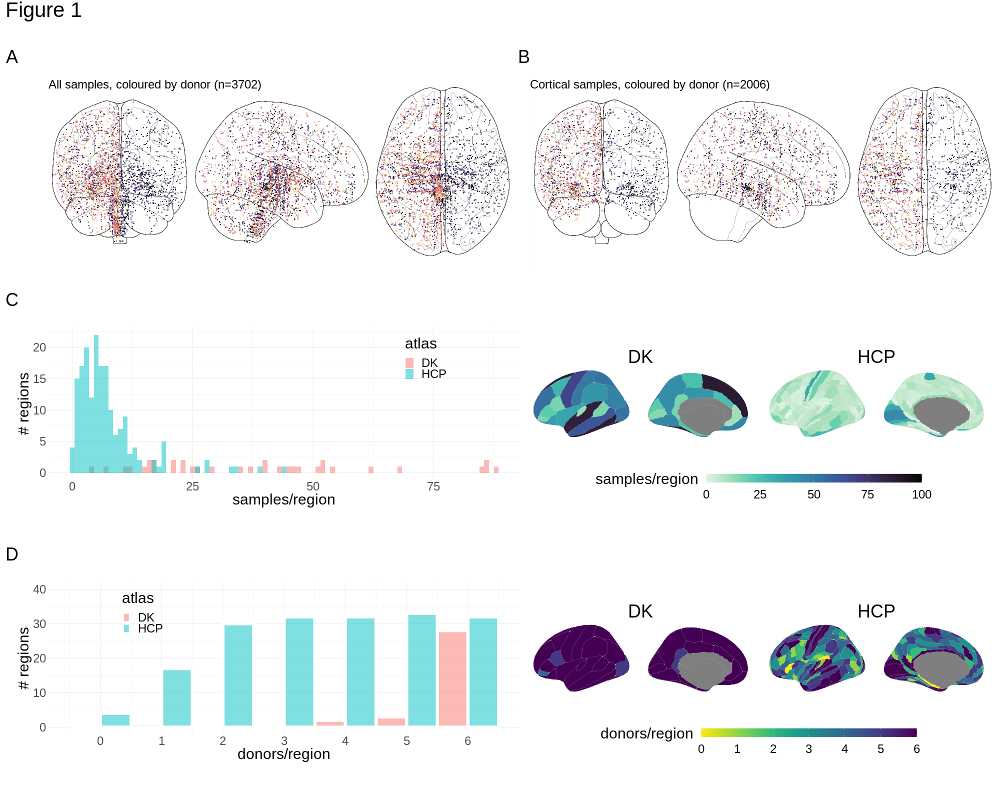

In [1408]:
%%R -i df_dist -i dist_dk -i dist_hcp -i df_donors -i donors_dk -i donors_hcp -w 2000 -h 1600

library(png)
library(ggpubr)

coords <- readPNG("coords.png")
g0 <- ggplot() + background_image(coords) + coord_fixed(ratio=8/20) + 
        ggtitle('All samples, coloured by donor (n=3702)') + theme(plot.title=element_text(size=24, vjust=-5))
    
coords_cx <- readPNG("coords_cx.png")
g0x <- ggplot() + background_image(coords_cx) + coord_fixed(ratio=8/20) + 
        ggtitle('Cortical samples, coloured by donor (n=2006)') + theme(plot.title=element_text(size=24, vjust=-5))

    
    
g1 <- ggplot(df_dist) + 
    geom_histogram(aes(x=count, fill=atlas), alpha=.5, binwidth=1, position='identity') + 
    theme_minimal() + ylab('# regions') + xlab('samples/region') + theme(legend.position=c(.8,.8))
    
source("brainPlots.R")
g2 <- plot_dk_dist(dist_dk) + ggtitle('DK')
g3 <- plot_hcp_dist(dist_hcp) + plot_layout(tag_level='new') + ggtitle('HCP')


g4 <- ggplot(df_donors) + 
    geom_histogram(aes(x=count, fill=atlas), alpha=.5, binwidth=1, position='dodge', color='white', size=3) + 
#     scale_fill_manual(values=c(muted('red'),muted('blue')), guide=guide_legend(reverse=T)) + 
    ylim(c(0,40)) +
    scale_x_continuous(breaks=seq(0,6,1)) +
    theme_minimal() + ylab('# regions') + xlab('donors/region') + theme(legend.position=c(.2,.8))

g5 <- plot_dk_dist(donors_dk, palette='viridis',lim=c(0,6),name='donors/region') + ggtitle('DK')
g6 <- plot_hcp_dist(donors_hcp, palette='viridis',lim=c(0,6),name='donors/region') + plot_layout(tag_level='new') + ggtitle('HCP')
    
((
    (g0 | g0x) /
    (g1 | ((g2 | g3) + plot_layout(tag_level='new', guides='collect') & theme(legend.position='bottom') ))  / 
    (g4 | ((g5 | g6) + plot_layout(tag_level='new', guides='collect') & theme(legend.position='bottom') )) 
) + plot_layout(heights=c(3,2,2)) & theme(text=element_text(size=30))
) + 
plot_annotation(tag_levels='A',title='Figure 1', theme=theme(plot.title=element_text(size=42))) & theme(plot.tag=element_text(size=36))

# OLD Figure 3: Pipeline

# Filtering

In [689]:
df_coefs = (hcp_3donors_ds5.coefs
         .loc[:2]
         .set_axis([f'PC{i+1}' for i in range(3)], axis=0).reset_index()
         .melt(id_vars=['index'])
        )
df_coefs

,index,gene_symbol,value
0,PC1,A1BG,-0.015087
1,PC2,A1BG,-0.005032
2,PC3,A1BG,0.002124
3,PC1,A1BG-AS1,-0.011854
4,PC2,A1BG-AS1,-0.003594
...,...,...,...
23914,PC2,ZZEF1,-0.009279
23915,PC3,ZZEF1,0.013359
23916,PC1,ZZZ3,-0.010575
23917,PC2,ZZZ3,-0.004174


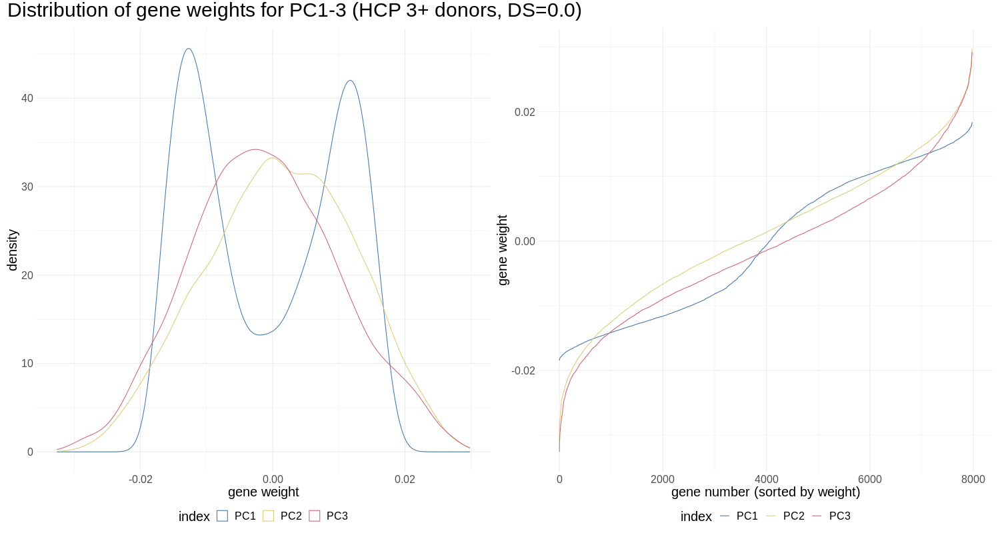

In [690]:
%%R -w 1500 -h 800 -i df_coefs
g1 <- ggplot(df_coefs) + geom_density(aes(x=value, color=index)) + theme_minimal() +
xlab('gene weight') + ylab('density')
g2 <- df_coefs %>% arrange(index, value) %>% group_by(index) %>% mutate(row=row_number()) %>%
ggplot(aes(x=row, y=value, color=index)) + geom_line(aes(group=index)) + theme_minimal() +
xlab('gene number (sorted by weight)') + ylab('gene weight')

((g1 + g2) & theme(text=element_text(size=20), legend.position='bottom') & scale_color_manual(values=tol(3))) + 
plot_annotation(title='Distribution of gene weights for PC1-3 (HCP 3+ donors, DS=0.0)', 
                theme=theme(plot.title=element_text(size=30))
               )

---

In [2]:
hcp_3donors_donor_expression = get_expression_abagen(
    fetch_hcp(), verbose=1, probe_selection='diff_stability', 
    region_agg='donors', lr_mirror='rightleft', donors_threshold=3,
    return_donors=True
)

INFO: Donor-specific atlases provided; using native coords for tissue samples
INFO: Reannotating probes with information from Arnatkevic̆iūtė et al., 2019, NeuroImage
INFO: Filtering probes with intensity-based threshold of 0.5
INFO: 32669 probes survive intensity-based filtering
INFO: Reducing probes indexing same gene with method: diff_stability
INFO: 15946 genes remain after probe filtering + selection
INFO: 458 / 477 samples matched to regions for donor #9861
INFO: 346 / 367 samples matched to regions for donor #10021
INFO: 173 / 181 samples matched to regions for donor #12876
INFO: 259 / 263 samples matched to regions for donor #14380
INFO: 222 / 224 samples matched to regions for donor #15496
INFO: 231 / 240 samples matched to regions for donor #15697
INFO: 361 / 360 regions have >=0 total samples
INFO: 137 / 360 regions have samples from >=3 donors
INFO: Aggregating samples to regions with provided region_agg: donors


AttributeError: 'list' object has no attribute 'dropna'

In [8]:
exp, stability = abagen.correct.keep_stable_genes(hcp_3donors_donor_expression, threshold=0.0, percentile=False, return_stability=True)

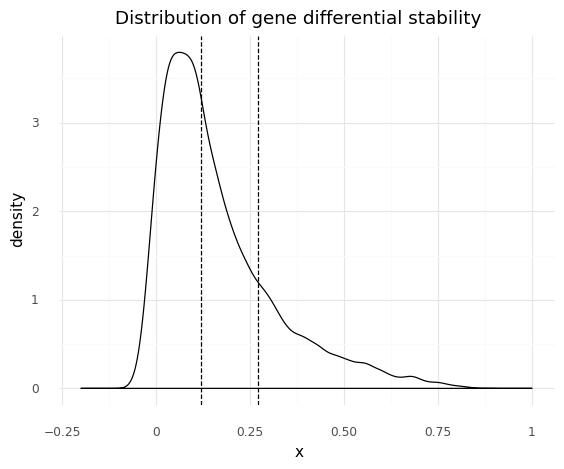

<ggplot: (2974223124152)>

In [24]:
(ggplot(pd.DataFrame({'x':stability})) + 
 geom_density(aes('x')) + xlim((-0.2,1)) +
 geom_vline(xintercept=np.quantile(stability,0.5),linetype='dashed') +
 geom_vline(xintercept=np.quantile(stability,0.8),linetype='dashed') +
 theme_minimal() + ggtitle('Distribution of gene differential stability')
)